<h1> <center> Transcriptomics of symptomatic hosts, potato and mint,$\\$ and asymptomatic host, mustard, during infection with host-adapted isolates of $Verticillim\; dahliae$ </center></h1>         

#### <h1> Authors: David Linnard Wheeler| Jeness Scott | Jeremiah Kam Sung Dung | Dennis Johnson </h1>         

## Table of Contents: <a class="anchor" id="toc-q"></a>
* [Objectives](#first-q)
* [Hypotheses](#second-q)
* [Experimental design](#third-q)
* [Matierial and Methods](#fourth-q)
* [Open data](#fifth-q)
* [Curate data](#sixth-q)
* [Summary statistics](#seventh-q)
* [Exploratory data analyses](#eighth-q)
* [Diagnostics](#nineth-q)
* [Parametric analyses: differential expression analysis](#tenth-q)
* [Visualization](#eleventh-q)
* [Export data](#twelveth-q)
* [Graveyard](#thirteenth-q)
* [Resources](#fourteenth-q)

### Objectives <a class="anchor" id="first-q"></a>  
[Back to Table of Contents](#toc-q)

* Characterize the differentially expressed genes involved in symptomatic (potato and mint) and asymptomatic interactions (mustard) between hosts and $Verticillium\; dahliae$ 

### Hypotheses <a class="anchor" id="second-q"></a>  
[Back to Table of Contents](#toc-q)

* **Science $H_o$ 1**: There are no differentially expressed genes (i) between symptomatic and asymptomatic hosts, (ii) between isolates within a host, and (iii) between hosts within an isolate.
* **Science $H_o$ 2**: Symptomatic and asymptomatic hosts exhibit similar responses to $V.\; dahliae$ infection
* **Science $H_o$ 3**: Gene expression of $V.\;dahliae$ does not differ accross fungal strains or between asymptomatic and symptomatic hosts
* **Statistical $H_o$**: 
    * Observed variation in DEG across treatments represents random variation, not systematic effects of hosts or isolates Variation in the DEG is unrelated to variation in the hosts and isolates and is no greater than expected by chance or sampling error.
    * More formally:
    
    $K_{ij} \sim NB(\mu_{ij}, \alpha_i)$
    
    where the counts, $K_{ij}$ for each gene, $i$, and sample, $j$, follow a negative binomial with the mean,$\mu_{ij}$, and dispersion parameter for each gene, $\alpha_i$. The dispersion parameter,$\alpha_i$, describes  the relationship between variance of an observed count and its mean value- the expected distance of the observed count from its mean. The mean,$\mu_{ij}$, can be decomposed into a sample-specific size factor, $s_j$, and a parameter,$q_{ij}$, that is proportional to the expected concentation of transcripts for sample $j$:
    
    $\mu_{ij} = s_j q_{ij}$
    
    Log2 fold changes for gene $i$ in each column of the model matrix, $X$,are provided by the coefficients, $\beta_i$:
    
    $log_2(q_{ij}) = x_{j.}\beta_i$
    
    * In short, the effect sizes between the groups are 0.

### Experimental design<a class="anchor" id="third-q"></a>  
[Back to Table of Contents](#toc-q)

* **Treatment structure**: 2 way factorial
    * **Independent variables**: 
        * 3 hosts:
            1. Potato 'Russet Burbank'
            2. Mint 'Black Mitchum'
            3. Brown mustard 'ISCI 99'
        * 3 fungi:
            1. $Verticillium\; dahliae\; 653$
            2. $Verticillium\; dahliae\; 111$
            3. Non-inoculated control
        * 1 time point:
            * 10 days after inoculation
        * 3 replicates
    * **Dependent variables**:
        * Constructs: 
            * Gene expression
        * Variables: 
            * Counts of RNA transcripts
            
* **Design structure**: randomized complete block design    
* **Observational unit**: plant
* **Experimental unit**: plant
* **Samples**: whole plants
* **Data**: 
    * RNA quantity and quality
    * Counts of RNA transcripts
* **Analysis**: 
    * Differential gene expression analyses        

### Materials and Methods<a class="anchor" id="fourth-q"></a>  
[Back to Table of Contents](#toc-q)

* **Inoculum preparation for root dips (3.5"pot)**:
    * Inoculum for isolates 653 and 111:
       * 180 plants/3 isolates = 60 plants/isolate * 100 ml/plant (Dung et al. 2010) = 6000 ml = 6 L inoculum
       * 6 L of 10$^6$ conidia/ml inoculum is needed
       * 6 L/200 ml/flask = 30 flasks 
    
    * Trial one planted: 5/1/2018
    * Trial one inoculated: 5/19/2018
    * First Harvest: potato, mint, and mustards harvested @ 10 dpi on 5/29/2018

### Open data<a class="anchor" id="fifth-q"></a>  
[Back to Table of Contents](#toc-q)

* **Install and invoke packages**

In [1]:
library("data.table")
library("tibble")
library("eulerr")
library("apeglm")
library("DESeq2")
library("edgeR")
library("DEFormats")
library("dplyr")
library("ggplot2")
library("reshape2")
library("pheatmap")
library("RColorBrewer")
library("PoiClaClu")
library("ggbeeswarm")
library("EnhancedVolcano")
library("devtools")
library("gridExtra")
library("grid")
library("cowplot")
library("genefilter")
library("viridis")
library("VennDiagram")
library("prob")
library("seqinr")
library("stringr")

Loading required package: S4Vectors

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which, which.max, which.min



Attaching package: ‘S4Vectors’


The

* Grab working directory

In [2]:
getwd()

[1] "/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/SCRIPTS"

* Set working directory

In [3]:
setwd("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/DATA/R_FILES/Reads")

* **Open data**

Fragments

In [4]:
DF = read.csv("Brassica.readcount.csv",header=T)

Gene names

In [5]:
gnDF = read.csv("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/DATA/R_FILES/Gene_names/DGE_GENE_NAME/Brassica_DEG_genename.csv",
                header=T)

In [6]:
names(gnDF)[2]<-"id"
names(gnDF)[3]<-"Comparison"
names(gnDF)[6]<-"KO.Name"
names(gnDF)[10]<-"Hit1_acc"

Sequences

In [7]:
fastafile <- read.fasta(file = "/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/DATA/R_FILES/Sequences/Mustard_unigene.fasta", 
                       seqtype = "AA",as.string = TRUE, set.attributes = FALSE)

Gene ontology

In [8]:
GO = read.csv("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/DATA/R_FILES/Gene_ontology/Brassica_Annotation_GO.csv",
                header=T)

### Curate data<a class="anchor" id="sixth-q"></a>  
[Back to Table of Contents](#toc-q)

* **Set first column to index**

In [9]:
DF_1 <- data.frame(DF[,-1], row.names = DF[,1])

In [10]:
head(DF_1)

,S3_3_2_1,S3_3_2_6,S3_3_2_2,S3_1_2_2,S3_1_2_4,S3_1_2_6,S3_2_2_3,S3_2_2_6,S3_2_2_1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Cluster-15354.17471,7.00,2.00,3.00,5.00,8.00,6.58,3.00,7.00,11.00
Cluster-15354.98515,182.48,133.08,110.39,144.10,197.75,116.73,107.75,170.79,114.25
Cluster-36085.0,244.00,305.00,221.00,82.00,114.00,119.00,163.00,109.00,152.00
Cluster-43502.0,2.00,0.00,1.00,6.00,3.00,4.00,4.00,16.00,11.00
Cluster-15354.99144,4.00,8.00,14.00,21.00,15.00,34.00,17.00,29.00,18.00
Cluster-15354.126327,0.00,7.11,61.60,57.86,158.69,54.04,79.30,158.09,52.67


* **For mint and mustard only, round floats/decimals to integer counts: since these data were generated $de\; novo$ decimals are abound**

In [11]:
DF = round(DF_1, digits = 0)

* **Create DGEList Object**

> * Convert dataframe to matrix

In [12]:
df = data.matrix(DF)

* **Vector for column/treatment names**

In [13]:
group = rep(c("Control", "653", "111"), each = 3)

In [14]:
dge = DGEList(df, group = group)

In [15]:
dge

,S3_3_2_1,S3_3_2_6,S3_3_2_2,S3_1_2_2,S3_1_2_4,S3_1_2_6,S3_2_2_3,S3_2_2_6,S3_2_2_1
Cluster-15354.17471,7,2,3,5,8,7,3,7,11
Cluster-15354.98515,182,133,110,144,198,117,108,171,114
Cluster-36085.0,244,305,221,82,114,119,163,109,152
Cluster-43502.0,2,0,1,6,3,4,4,16,11
Cluster-15354.99144,4,8,14,21,15,34,17,29,18
Cluster-15354.126327,0,7,62,58,159,54,79,158,53
Cluster-15354.104164,0,0,0,1,0,4,2,6,4
Cluster-20115.1,0,11,18,12,19,0,20,0,21
Cluster-15354.27975,0,0,4,0,0,0,0,0,0
Cluster-15354.83798,85,0,0,0,0,82,41,14,100


* **Coerce DGElist to DESeqDataSet**

In [16]:
dds = as.DESeqDataSet(dge)

converting counts to integer mode

  it appears that the last variable in the design formula, 'group',
  has a factor level, 'Control', which is not the reference level. we recommend
  to use factor(...,levels=...) or relevel() to set this as the reference level
  before proceeding. for more information, please see the 'Note on factor levels'
  in vignette('DESeq2').



In [17]:
dds

class: DESeqDataSet 
dim: 222364 9 
metadata(1): version
assays(1): counts
rownames(222364): Cluster-15354.17471 Cluster-15354.98515 ...
  Cluster-18205.0 Cluster-15354.10333
rowData names(0):
colnames(9): S3_3_2_1 S3_3_2_6 ... S3_2_2_6 S3_2_2_1
colData names(3): group lib.size norm.factors

### Summary Statistics<a class="anchor" id="seventh-q"></a>  
[Back to Table of Contents](#toc-q)

**The total number of DEGS per comparison**

In [84]:
table(DEGS$Comparison)


653v111   Cv111   Cv653 
     93    1219    1529 

Tabulate DEG data (Comparison - basemean -direction of regulation - log$_2$-fold change - $p$-value - adjusted $p$-value - gene name - function)

**DEGs from 653 vs Control**

In [85]:
Cv653_gn = subset(Cv653_GeneNames, Comparison == "Cv653")

* Remove DEGS/rows from humans

In [86]:
Cv653_gn = Cv653_gn[!grepl("HUMAN", Cv653_gn$Hit1_acc ),]

* Remove DEGs/rows from flies

In [87]:
Cv653_gn = Cv653_gn[!grepl("DROME", Cv653_gn$Hit1_acc ),]

* Order genes by fold change

In [88]:
table_cv6 <- (Cv653_gn[order((-Cv653_gn$log2FoldChange)),c(9,1,2,3,6,7,16)])

* Round digits

In [89]:
table_cv6$baseMean <- round(table_cv6$baseMean, 1)
table_cv6$log2FoldChange <- round(table_cv6$log2FoldChange, 1)
table_cv6$pvalue <- round(table_cv6$pvalue, 7)
table_cv6$padj <- round(table_cv6$padj, 7)

* Format columns

> * Comparison

In [90]:
table_cv6$Comparison = "653 vs control"

> - Host

In [91]:
table_cv6$Host = "Brassica juncea" # Brassica juncea ISCI 199

> - Gene function

In [92]:
table_cv6$Function = NA

> * Sequence

In [93]:
table_cv6$Sequence = NA

* Reorder columns

In [94]:
table_cv6 = table_cv6[,c(8,1,3:7,2,9:10)]

* Grab top 5 genes

In [63]:
Up_cv6 = head(table_cv6,n=5)

> - Add column for regulation status

In [64]:
Up_cv6$Regulation = "up"

- Grab botton 5 genes

In [65]:
Down_cv6 = tail(table_cv6,n=5)

> - Add column for regulation status

In [66]:
Down_cv6$Regulation = "down"

* Table for control vs 653

In [67]:
Table_cv6 = rbind(Up_cv6,Down_cv6)

In [68]:
Table_cv6

,Host,Comparison,baseMean,log2FoldChange,pvalue,padj,Hit1_acc,id,Function,Sequence,Regulation
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<lgl>,<lgl>,<chr>
1427,Brassica juncea,653 vs control,144.4,4.8,0e+00,0.0e+00,CCA1_ARATH,Cluster-15354.63552,NA,NA,up
71,Brassica juncea,653 vs control,119.4,4.0,0e+00,0.0e+00,-,Cluster-15354.103410,NA,NA,up
92,Brassica juncea,653 vs control,84.0,3.0,0e+00,2.0e-07,NUP1_ARATH,Cluster-15354.104448,NA,NA,up
802,Brassica juncea,653 vs control,20.1,2.9,1e-07,9.4e-06,LAG13_ARATH,Cluster-15354.23044,NA,NA,up
1475,Brassica juncea,653 vs control,29.3,2.9,0e+00,3.9e-06,TRL11_ARATH,Cluster-15354.65790,NA,NA,up
1076,Brassica juncea,653 vs control,36.8,-4.5,0e+00,0.0e+00,PDRP2_ARATH,Cluster-15354.43585,NA,NA,down
2511,Brassica juncea,653 vs control,421.2,-4.5,0e+00,0.0e+00,UVB31_ARATH,Cluster-15354.91585,NA,NA,down
735,Brassica juncea,653 vs control,94.4,-4.7,0e+00,0.0e+00,-,Cluster-15354.16367,NA,NA,down
423,Brassica juncea,653 vs control,405.5,-5.7,0e+00,0.0e+00,-,Cluster-15354.125147,NA,NA,down


* Rearrange columns

In [69]:
Table_cv6 = Table_cv6[,c(1:2,11,3:10)]

In [70]:
Table_cv6

,Host,Comparison,Regulation,baseMean,log2FoldChange,pvalue,padj,Hit1_acc,id,Function,Sequence
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<lgl>,<lgl>
1427,Brassica juncea,653 vs control,up,144.4,4.8,0e+00,0.0e+00,CCA1_ARATH,Cluster-15354.63552,NA,NA
71,Brassica juncea,653 vs control,up,119.4,4.0,0e+00,0.0e+00,-,Cluster-15354.103410,NA,NA
92,Brassica juncea,653 vs control,up,84.0,3.0,0e+00,2.0e-07,NUP1_ARATH,Cluster-15354.104448,NA,NA
802,Brassica juncea,653 vs control,up,20.1,2.9,1e-07,9.4e-06,LAG13_ARATH,Cluster-15354.23044,NA,NA
1475,Brassica juncea,653 vs control,up,29.3,2.9,0e+00,3.9e-06,TRL11_ARATH,Cluster-15354.65790,NA,NA
1076,Brassica juncea,653 vs control,down,36.8,-4.5,0e+00,0.0e+00,PDRP2_ARATH,Cluster-15354.43585,NA,NA
2511,Brassica juncea,653 vs control,down,421.2,-4.5,0e+00,0.0e+00,UVB31_ARATH,Cluster-15354.91585,NA,NA
735,Brassica juncea,653 vs control,down,94.4,-4.7,0e+00,0.0e+00,-,Cluster-15354.16367,NA,NA
423,Brassica juncea,653 vs control,down,405.5,-5.7,0e+00,0.0e+00,-,Cluster-15354.125147,NA,NA


* Rename column headers

In [71]:
names(Table_cv6)[4] = "Base mean"
names(Table_cv6)[5] = "Log2 fold change"
names(Table_cv6)[6] = "p-value"
names(Table_cv6)[7] = "adjusted p-value"
names(Table_cv6)[8] = "Gene name"
names(Table_cv6)[9] = "Gene ID"
names(Table_cv6)[10] = "Function"
names(Table_cv6)[11] = "Sequence"

In [72]:
Table_cv6

,Host,Comparison,Regulation,Base mean,Log2 fold change,p-value,adjusted p-value,Gene name,Gene ID,Function,Sequence
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<lgl>,<lgl>
1427,Brassica juncea,653 vs control,up,144.4,4.8,0e+00,0.0e+00,CCA1_ARATH,Cluster-15354.63552,NA,NA
71,Brassica juncea,653 vs control,up,119.4,4.0,0e+00,0.0e+00,-,Cluster-15354.103410,NA,NA
92,Brassica juncea,653 vs control,up,84.0,3.0,0e+00,2.0e-07,NUP1_ARATH,Cluster-15354.104448,NA,NA
802,Brassica juncea,653 vs control,up,20.1,2.9,1e-07,9.4e-06,LAG13_ARATH,Cluster-15354.23044,NA,NA
1475,Brassica juncea,653 vs control,up,29.3,2.9,0e+00,3.9e-06,TRL11_ARATH,Cluster-15354.65790,NA,NA
1076,Brassica juncea,653 vs control,down,36.8,-4.5,0e+00,0.0e+00,PDRP2_ARATH,Cluster-15354.43585,NA,NA
2511,Brassica juncea,653 vs control,down,421.2,-4.5,0e+00,0.0e+00,UVB31_ARATH,Cluster-15354.91585,NA,NA
735,Brassica juncea,653 vs control,down,94.4,-4.7,0e+00,0.0e+00,-,Cluster-15354.16367,NA,NA
423,Brassica juncea,653 vs control,down,405.5,-5.7,0e+00,0.0e+00,-,Cluster-15354.125147,NA,NA


**DEGs from 111 vs Control**

In [73]:
Cv111_gn = subset(Cv111_GeneNames, Comparison == "Cv111")

* Remove DEGS/rows from humans

In [74]:
Cv111_gn = Cv111_gn[!grepl("HUMAN", Cv111_gn$Hit1_acc ),]

* Order genes by fold change

In [75]:
table_cv1 <- (Cv111_gn[order((-Cv111_gn$log2FoldChange)),c(9,1,2,3,6,7,16)])

* Round digits

In [76]:
table_cv1$baseMean <- round(table_cv1$baseMean, 1)
table_cv1$log2FoldChange <- round(table_cv1$log2FoldChange, 1)
table_cv1$pvalue <- round(table_cv1$pvalue, 7)
table_cv1$padj <- round(table_cv1$padj, 7)

* Format Columns

> * Comparisons

In [77]:
table_cv1$Comparison = "111 vs control"

* Host

In [78]:
table_cv1$Host = "Brassica juncea"

> * Gene function

In [79]:
table_cv1$Function = NA

* Sequence

In [80]:
table_cv1$Sequence = NA

* Reorder columns

In [81]:
table_cv1 = table_cv1[,c(8,1,3:7,2,9:10)]

- Grab top 5 DEGs

In [82]:
Up_cv1 = head(table_cv1,n=5)

> * Column for regulation status

In [83]:
Up_cv1$Regulation = "up"

> * Grab bottom 5 DEGs

In [84]:
Down_cv1 = tail(table_cv1,n=5)

> * Column for regulation status

In [85]:
Down_cv1$Regulation = "down"

- Table for control vs 111

In [86]:
Table_cv1 = rbind(Up_cv1,Down_cv1)

In [87]:
Table_cv1

,Host,Comparison,baseMean,log2FoldChange,pvalue,padj,Hit1_acc,id,Function,Sequence,Regulation
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<lgl>,<lgl>,<chr>
70,Brassica juncea,111 vs control,119.4,4.2,0,0e+00,-,Cluster-15354.103410,NA,NA,up
1426,Brassica juncea,111 vs control,144.4,4.0,0,0e+00,CCA1_ARATH,Cluster-15354.63552,NA,NA,up
2492,Brassica juncea,111 vs control,36.0,3.7,0,1e-06,-,Cluster-15354.91015,NA,NA,up
93,Brassica juncea,111 vs control,84.0,3.5,0,0e+00,NUP1_ARATH,Cluster-15354.104448,NA,NA,up
2809,Brassica juncea,111 vs control,21.6,3.1,0,5e-06,CIA30_ARATH,Cluster-46783.1,NA,NA,up
1217,Brassica juncea,111 vs control,51.2,-4.3,0,0e+00,GLYC7_ARATH,Cluster-15354.51991,NA,NA,down
1151,Brassica juncea,111 vs control,82.7,-4.4,0,0e+00,SCL1_ARATH,Cluster-15354.47671,NA,NA,down
1082,Brassica juncea,111 vs control,91.1,-4.4,0,0e+00,-,Cluster-15354.44072,NA,NA,down
588,Brassica juncea,111 vs control,73.0,-4.5,0,0e+00,-,Cluster-15354.135436,NA,NA,down


* Rearrange columns

In [88]:
Table_cv1 = Table_cv1[,c(1:2,11,3:10)]

In [89]:
Table_cv1

,Host,Comparison,Regulation,baseMean,log2FoldChange,pvalue,padj,Hit1_acc,id,Function,Sequence
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<lgl>,<lgl>
70,Brassica juncea,111 vs control,up,119.4,4.2,0,0e+00,-,Cluster-15354.103410,NA,NA
1426,Brassica juncea,111 vs control,up,144.4,4.0,0,0e+00,CCA1_ARATH,Cluster-15354.63552,NA,NA
2492,Brassica juncea,111 vs control,up,36.0,3.7,0,1e-06,-,Cluster-15354.91015,NA,NA
93,Brassica juncea,111 vs control,up,84.0,3.5,0,0e+00,NUP1_ARATH,Cluster-15354.104448,NA,NA
2809,Brassica juncea,111 vs control,up,21.6,3.1,0,5e-06,CIA30_ARATH,Cluster-46783.1,NA,NA
1217,Brassica juncea,111 vs control,down,51.2,-4.3,0,0e+00,GLYC7_ARATH,Cluster-15354.51991,NA,NA
1151,Brassica juncea,111 vs control,down,82.7,-4.4,0,0e+00,SCL1_ARATH,Cluster-15354.47671,NA,NA
1082,Brassica juncea,111 vs control,down,91.1,-4.4,0,0e+00,-,Cluster-15354.44072,NA,NA
588,Brassica juncea,111 vs control,down,73.0,-4.5,0,0e+00,-,Cluster-15354.135436,NA,NA


* Rename column headers

In [90]:
names(Table_cv1)[4] = "Base mean"
names(Table_cv1)[5] = "Log2 fold change"
names(Table_cv1)[6] = "p-value"
names(Table_cv1)[7] = "adjusted p-value"
names(Table_cv1)[8] = "Gene name"
names(Table_cv1)[9] = "Gene ID"
names(Table_cv1)[10] = "Function"
names(Table_cv1)[11] = "Sequence"

In [91]:
Table_cv1

,Host,Comparison,Regulation,Base mean,Log2 fold change,p-value,adjusted p-value,Gene name,Gene ID,Function,Sequence
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<lgl>,<lgl>
70,Brassica juncea,111 vs control,up,119.4,4.2,0,0e+00,-,Cluster-15354.103410,NA,NA
1426,Brassica juncea,111 vs control,up,144.4,4.0,0,0e+00,CCA1_ARATH,Cluster-15354.63552,NA,NA
2492,Brassica juncea,111 vs control,up,36.0,3.7,0,1e-06,-,Cluster-15354.91015,NA,NA
93,Brassica juncea,111 vs control,up,84.0,3.5,0,0e+00,NUP1_ARATH,Cluster-15354.104448,NA,NA
2809,Brassica juncea,111 vs control,up,21.6,3.1,0,5e-06,CIA30_ARATH,Cluster-46783.1,NA,NA
1217,Brassica juncea,111 vs control,down,51.2,-4.3,0,0e+00,GLYC7_ARATH,Cluster-15354.51991,NA,NA
1151,Brassica juncea,111 vs control,down,82.7,-4.4,0,0e+00,SCL1_ARATH,Cluster-15354.47671,NA,NA
1082,Brassica juncea,111 vs control,down,91.1,-4.4,0,0e+00,-,Cluster-15354.44072,NA,NA
588,Brassica juncea,111 vs control,down,73.0,-4.5,0,0e+00,-,Cluster-15354.135436,NA,NA


**DEGs from 653 vs 111**

In [92]:
i653v111_gn = subset(i653v111_GeneNames, Comparison == "653v111")

* Remove DEGs/rows from humans

In [93]:
i653v111_gn = i653v111_gn[!grepl("HUMAN", i653v111_gn$Hit1_acc ),]

* Order genes by fold change

In [94]:
table_6v1 <- (i653v111_gn[order((-i653v111_gn$log2FoldChange)),c(9,1,2,3,6,7,16)])

* Round digits

In [95]:
table_6v1$baseMean <- round(table_6v1$baseMean, 1)
table_6v1$log2FoldChange <- round(table_6v1$log2FoldChange, 1)
table_6v1$pvalue <- round(table_6v1$pvalue, 7)
table_6v1$padj <- round(table_6v1$padj, 7)

* Format columns

> - By Columns

In [96]:
table_6v1$Comparison = "111 vs 653"

> * Host

In [97]:
table_6v1$Host = "Brassica juncea"

> * Gene function

In [98]:
table_6v1$Function = NA

> * Sequence

In [99]:
table_6v1$Sequence = NA

* Reorder columns

In [100]:
table_6v1 = table_6v1[,c(8,1,3:7,2,9:10)]

> * Grab top 5 genes

In [101]:
Up_6v1 = head(table_6v1,n=5)

> * Column for regulation

In [102]:
Up_6v1$Regulation = "up"

> - Grab bottom 5 DEGs

In [103]:
Down_6v1 = tail(table_6v1,n=5)

> * Column for regulation

In [104]:
Down_6v1$Regulation = "down"

* Table 653 vs 111

In [105]:
Table_6v1 = rbind(Up_6v1,Down_6v1)

* Rearrange columns

In [106]:
Table_6v1 = Table_6v1[,c(1:2,11,3:10)]

In [107]:
Table_6v1

,Host,Comparison,Regulation,baseMean,log2FoldChange,pvalue,padj,Hit1_acc,id,Function,Sequence
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<lgl>,<lgl>
2325,Brassica juncea,111 vs 653,up,523.5,6.2,0,0,-,Cluster-15354.86688,NA,NA
2512,Brassica juncea,111 vs 653,up,421.2,6.1,0,0,UVB31_ARATH,Cluster-15354.91585,NA,NA
422,Brassica juncea,111 vs 653,up,405.5,5.7,0,0,-,Cluster-15354.125147,NA,NA
736,Brassica juncea,111 vs 653,up,94.4,5.1,0,0,-,Cluster-15354.16367,NA,NA
2236,Brassica juncea,111 vs 653,up,160.5,4.8,0,0,Y8359_ORYSI,Cluster-15354.84875,NA,NA
1216,Brassica juncea,111 vs 653,down,51.2,-3.8,0,0,GLYC7_ARATH,Cluster-15354.51991,NA,NA
2458,Brassica juncea,111 vs 653,down,47.9,-4.0,0,0,-,Cluster-15354.9015,NA,NA
587,Brassica juncea,111 vs 653,down,73.0,-4.5,0,0,-,Cluster-15354.135436,NA,NA
1150,Brassica juncea,111 vs 653,down,82.7,-4.6,0,0,SCL1_ARATH,Cluster-15354.47671,NA,NA


* Rename columns

In [108]:
names(Table_6v1)[4] = "Base mean"
names(Table_6v1)[5] = "Log2 fold change"
names(Table_6v1)[6] = "p-value"
names(Table_6v1)[7] = "adjusted p-value"
names(Table_6v1)[8] = "Gene name"
names(Table_6v1)[9] = "Gene ID"
names(Table_6v1)[10] = "Function"
names(Table_6v1)[11] = "Sequence"

In [109]:
Table_6v1

,Host,Comparison,Regulation,Base mean,Log2 fold change,p-value,adjusted p-value,Gene name,Gene ID,Function,Sequence
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<lgl>,<lgl>
2325,Brassica juncea,111 vs 653,up,523.5,6.2,0,0,-,Cluster-15354.86688,NA,NA
2512,Brassica juncea,111 vs 653,up,421.2,6.1,0,0,UVB31_ARATH,Cluster-15354.91585,NA,NA
422,Brassica juncea,111 vs 653,up,405.5,5.7,0,0,-,Cluster-15354.125147,NA,NA
736,Brassica juncea,111 vs 653,up,94.4,5.1,0,0,-,Cluster-15354.16367,NA,NA
2236,Brassica juncea,111 vs 653,up,160.5,4.8,0,0,Y8359_ORYSI,Cluster-15354.84875,NA,NA
1216,Brassica juncea,111 vs 653,down,51.2,-3.8,0,0,GLYC7_ARATH,Cluster-15354.51991,NA,NA
2458,Brassica juncea,111 vs 653,down,47.9,-4.0,0,0,-,Cluster-15354.9015,NA,NA
587,Brassica juncea,111 vs 653,down,73.0,-4.5,0,0,-,Cluster-15354.135436,NA,NA
1150,Brassica juncea,111 vs 653,down,82.7,-4.6,0,0,SCL1_ARATH,Cluster-15354.47671,NA,NA


**Combine all tables**

In [110]:
table_all = rbind(Table_cv6, Table_cv1, Table_6v1)

In [111]:
table_all 

,Host,Comparison,Regulation,Base mean,Log2 fold change,p-value,adjusted p-value,Gene name,Gene ID,Function,Sequence
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<lgl>,<lgl>
1427,Brassica juncea,653 vs control,up,144.4,4.8,0e+00,0.0e+00,CCA1_ARATH,Cluster-15354.63552,NA,NA
71,Brassica juncea,653 vs control,up,119.4,4.0,0e+00,0.0e+00,-,Cluster-15354.103410,NA,NA
92,Brassica juncea,653 vs control,up,84.0,3.0,0e+00,2.0e-07,NUP1_ARATH,Cluster-15354.104448,NA,NA
802,Brassica juncea,653 vs control,up,20.1,2.9,1e-07,9.4e-06,LAG13_ARATH,Cluster-15354.23044,NA,NA
1475,Brassica juncea,653 vs control,up,29.3,2.9,0e+00,3.9e-06,TRL11_ARATH,Cluster-15354.65790,NA,NA
1076,Brassica juncea,653 vs control,down,36.8,-4.5,0e+00,0.0e+00,PDRP2_ARATH,Cluster-15354.43585,NA,NA
2511,Brassica juncea,653 vs control,down,421.2,-4.5,0e+00,0.0e+00,UVB31_ARATH,Cluster-15354.91585,NA,NA
735,Brassica juncea,653 vs control,down,94.4,-4.7,0e+00,0.0e+00,-,Cluster-15354.16367,NA,NA
423,Brassica juncea,653 vs control,down,405.5,-5.7,0e+00,0.0e+00,-,Cluster-15354.125147,NA,NA


**Insert sequences**

* First, subset the target sequences from the fasta file

In [112]:
seqs = fastafile[names(fastafile) %in% table_all[,9]]

Sanity checks

In [113]:
length(seqs)

[1] 18

In [114]:
length(seqs) == length(table_all[,9])

[1] FALSE

In [115]:
sum(abs(length(seqs) - length(table_all[,9])))

[1] 12

> * How many duplicate genes?

In [116]:
sum(duplicated(table_all[,9]))

[1] 12

- Extract gene IDs

In [117]:
names(seqs)

[1] "Cluster-15354.125147" "Cluster-15354.63552"  "Cluster-15354.91015" 
 [4] "Cluster-15354.16367"  "Cluster-15354.86688"  "Cluster-15354.84875" 
 [7] "Cluster-15354.65790"  "Cluster-15354.51991"  "Cluster-15354.47671" 
[10] "Cluster-15354.104448" "Cluster-15354.43585"  "Cluster-15354.9015"  
[13] "Cluster-46783.1"      "Cluster-15354.135436" "Cluster-15354.23044" 
[16] "Cluster-15354.91585"  "Cluster-15354.103410" "Cluster-15354.44072"

* Match names of gene IDs from fasta file with column in table

In [118]:
# For every row in the "Gene ID" column
for (i in seq(table_all[,9])){

# For every entry in the list of sequences
    for (j in seq(names(seqs))){

        # If the row matches the sequence
        if (table_all[i,9] == names(seqs[j])){
            
            # Grab the gene ID
            y = names(seqs[j])
            
            # Grab the sequence
            x = (seqs[j]) # unlist
            
            #
            # x = (str_split(x, "''"))
            
            # Add gene ID to table
            table_all[i,12] = y

            # Add sequence to table
            table_all[i,11] = x
     }
        
 }

 }

* Table

In [119]:
table_all

Host            Comparison     Regulation Base mean Log2 fold change
1427 Brassica juncea 653 vs control up         144.4      4.8            
71   Brassica juncea 653 vs control up         119.4      4.0            
92   Brassica juncea 653 vs control up          84.0      3.0            
802  Brassica juncea 653 vs control up          20.1      2.9            
1475 Brassica juncea 653 vs control up          29.3      2.9            
1076 Brassica juncea 653 vs control down        36.8     -4.5            
2511 Brassica juncea 653 vs control down       421.2     -4.5            
735  Brassica juncea 653 vs control down        94.4     -4.7            
423  Brassica juncea 653 vs control down       405.5     -5.7            
2326 Brassica juncea 653 vs control down       523.5     -6.2            
70   Brassica juncea 111 vs control up         119.4      4.2            
1426 Brassica juncea 111 vs control up         144.4      4.0            
2492 Brassica juncea 111 vs control up          36.0      3.7            
93   Brassica juncea 111 vs control up          84.0      3.5            
2809 Brassica juncea 111 vs control up          21.6      3.1            
1217 Brassica juncea 111 vs control down        51.2     -4.3            
1151 Brassica juncea 111 vs control down        82.7     -4.4            
1082 Brassica juncea 111 vs control down        91.1     -4.4            
588  Brassica juncea 111 vs control down        73.0     -4.5            
1077 Brassica juncea 111 vs control down        36.8     -4.5            
2325 Brassica juncea 111 vs 653     up         523.5      6.2            
2512 Brassica juncea 111 vs 653     up         421.2      6.1            
422  Brassica juncea 111 vs 653     up         405.5      5.7            
736  Brassica juncea 111 vs 653     up          94.4      5.1            
2236 Brassica juncea 111 vs 653     up         160.5      4.8            
1216 Brassica juncea 111 vs 653     down        51.2     -3.8            
2458 Brassica juncea 111 vs 653     down        47.9     -4.0            
587  Brassica juncea 111 vs 653     down        73.0     -4.5            
1150 Brassica juncea 111 vs 653     down        82.7     -4.6            
1081 Brassica juncea 111 vs 653     down        91.1     -4.9            
     p-value adjusted p-value Gene name   Gene ID              Function
1427 0e+00   0.0e+00          CCA1_ARATH  Cluster-15354.63552  NA      
71   0e+00   0.0e+00          -           Cluster-15354.103410 NA      
92   0e+00   2.0e-07          NUP1_ARATH  Cluster-15354.104448 NA      
802  1e-07   9.4e-06          LAG13_ARATH Cluster-15354.23044  NA      
1475 0e+00   3.9e-06          TRL11_ARATH Cluster-15354.65790  NA      
1076 0e+00   0.0e+00          PDRP2_ARATH Cluster-15354.43585  NA      
2511 0e+00   0.0e+00          UVB31_ARATH Cluster-15354.91585  NA      
735  0e+00   0.0e+00          -           Cluster-15354.16367  NA      
423  0e+00   0.0e+00          -           Cluster-15354.125147 NA      
2326 0e+00   0.0e+00          -           Cluster-15354.86688  NA      
70   0e+00   0.0e+00          -           Cluster-15354.103410 NA      
1426 0e+00   0.0e+00          CCA1_ARATH  Cluster-15354.63552  NA      
2492 0e+00   1.0e-06          -           Cluster-15354.91015  NA      
93   0e+00   0.0e+00          NUP1_ARATH  Cluster-15354.104448 NA      
2809 0e+00   5.0e-06          CIA30_ARATH Cluster-46783.1      NA      
1217 0e+00   0.0e+00          GLYC7_ARATH Cluster-15354.51991  NA      
1151 0e+00   0.0e+00          SCL1_ARATH  Cluster-15354.47671  NA      
1082 0e+00   0.0e+00          -           Cluster-15354.44072  NA      
588  0e+00   0.0e+00          -           Cluster-15354.135436 NA      
1077 0e+00   0.0e+00          PDRP2_ARATH Cluster-15354.43585  NA      
2325 0e+00   0.0e+00          -           Cluster-15354.86688  NA      
2512 0e+00   0.0e+00          UVB31_ARATH Cluster-15354.91585  NA      
422  0e+00   0.0e+00          -           Cluster-15354

* Sanity checks

> * Do the names match?

In [120]:
table_all[,9] == table_all[,12]

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[16] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE

> - Do the sequence lengths match?

> * Reorder sequence names first

In [121]:
ordered_seqs = seqs[order(match(names(seqs), table_all[,9]))]  

In [122]:
nchar(ordered_seqs) == nchar(unique(table_all[,11]))

Cluster-15354.63552 Cluster-15354.103410 Cluster-15354.104448 
                TRUE                 TRUE                 TRUE 
 Cluster-15354.23044  Cluster-15354.65790  Cluster-15354.43585 
                TRUE                 TRUE                 TRUE 
 Cluster-15354.91585  Cluster-15354.16367 Cluster-15354.125147 
                TRUE                 TRUE                 TRUE 
 Cluster-15354.86688  Cluster-15354.91015      Cluster-46783.1 
                TRUE                 TRUE                 TRUE 
 Cluster-15354.51991  Cluster-15354.47671  Cluster-15354.44072 
                TRUE                 TRUE                 TRUE 
Cluster-15354.135436  Cluster-15354.84875   Cluster-15354.9015 
                TRUE                 TRUE                 TRUE

* Length of sequences

In [123]:
summary(nchar(table_all[,10]))

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
     NA      NA      NA     NaN      NA      NA      30 

**Add column for Gene Ontology**

* Grab only the GO data for the gene IDs of interest

> * Subset method 1

In [124]:
GO_df = subset(GO, as.character(GO$Gene.ID) %in% table_all[,9])

> * Subset method 2

In [125]:
GO_DF = setDT(GO)[as.character(GO$Gene.ID) %chin% table_all[,9]]

* Sanity check- are the data the same?

In [126]:
GO_df == GO_DF

Warning message in eval(expr, envir, enclos):
“Incompatible methods ("Ops.data.frame", "Ops.data.table") for "=="”


ERROR: Error in GO_df == GO_DF: comparison of these types is not implemented


* Which DEGs are in GO?

In [127]:
unique(table_all[,9][table_all[,9] %in% as.character(GO_df$Gene.ID)])

[1] "Cluster-15354.23044"  "Cluster-15354.65790"  "Cluster-15354.43585" 
 [4] "Cluster-15354.125147" "Cluster-15354.91015"  "Cluster-15354.51991" 
 [7] "Cluster-15354.47671"  "Cluster-15354.44072"  "Cluster-15354.135436"
[10] "Cluster-15354.84875"  "Cluster-15354.9015"

In [128]:
length(unique(table_all[,9][table_all[,9] %in% as.character(GO_df$Gene.ID)]))

[1] 11

* Which DEGs are not in GO?

In [129]:
unique(table_all[,9][!(table_all[,9] %in% GO_df$Gene.ID)])

[1] "Cluster-15354.63552"  "Cluster-15354.103410" "Cluster-15354.104448"
[4] "Cluster-15354.91585"  "Cluster-15354.16367"  "Cluster-15354.86688" 
[7] "Cluster-46783.1"

In [130]:
length(unique(table_all[,9][!(table_all[,9] %in% GO_df$Gene.ID)]))

[1] 7

* How many total DEGs?

In [131]:
length(unique(table_all[,9][table_all[,9] %in% as.character(GO_df$Gene.ID)])) + length(unique(table_all[,9][!(table_all[,9] %in% GO_df$Gene.ID)]))

[1] 18

* Add GO to dataframe

In [132]:
# For every row in the "Gene ID" column
for (i in seq(table_all[,9])){

# For every entry in the list of sequences
    for (j in seq(as.character(GO_DF$Gene.ID))){

        # If the row matches the sequence
        if (table_all[i,9] == (as.character(GO_DF$Gene.ID[j]))){
            
            # Grab the gene ID
            y = (as.character(GO_DF$Gene.ID[j]))
            
            # Grab the molecular function column
            x = (as.character(GO_DF$MF.Description[j])) # unlist
            
            # Add gene ID to table
            table_all[i,12] = y

            # Add molecular function to table
            table_all[i,10] = x
    }   
 }

 }

* Sanity checks

> * Do the names match?

In [133]:
sum((table_all[,9] == table_all[,12]),na.rm=T)

[1] 30

In [134]:
table_all[,9] == table_all[,12]

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[16] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE

* Add column for source of gene ontology information

In [135]:
table_all$Source = ifelse(table_all$Function == 'NA', 'NA', 'GO')

* Remove excessive columns

In [136]:
names(table_all)

[1] "Host"             "Comparison"       "Regulation"       "Base mean"       
 [5] "Log2 fold change" "p-value"          "adjusted p-value" "Gene name"       
 [9] "Gene ID"          "Function"         "Sequence"         "V12"             
[13] "Source"

In [137]:
table_all = table_all[,c(1:5,8:10,13,11)]

* Add functional data from other sources

In [138]:
table_all$Function = ifelse(table_all[,7] == 'Cluster-15354.63552',
                            'PREDICTED: protein CCA1 isoform X2 [Brassica rapa]'
                            ,table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'Cluster-15354.63552',
                         'Blast_NR, Blast_NT', table_all$Source)

In [139]:
table_all$Function = ifelse(table_all[,7] == 'Cluster-15354.103410',
                            'PREDICTED: probable splicing factor, arginine/serine-rich 7 isoform X2 [Brassica rapa]>gi|674895924|emb|CDY36904.1| BnaA06g16890D [Brassica napus]'
                            ,table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'Cluster-15354.103410',
                         'Blast_NR', table_all$Source)

In [140]:
table_all$Function = ifelse(table_all[,7] == 'Cluster-15354.51831',
                            'PREDICTED: Brassica rapa protein SPT2 homolog (LOC103864381), transcript variant X2, mRNA'
                            ,table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'Cluster-15354.51831',
                         'Blast_swissprot,Blast_NT,Blast_NR', table_all$Source)


In [141]:
table_all$Function = ifelse(table_all[,7] == 'Cluster-15354.104448',
                            'PREDICTED: nuclear pore complex protein Nup214-like [Brassica rapa]'
                            ,table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'Cluster-15354.104448',
                         'Blast_swissprot,Blast_NT,Blast_NR', table_all$Source)

In [142]:
table_all$Function = ifelse(table_all[,7] == 'Cluster-15354.23044',
                            'PREDICTED: Brassica rapa LAG1 longevity assurance homolog 3 (LOC103843044), transcript variant X1, mRNA/ ceramide synthetase/ Protein transporter of the TRAM (translocating chain-associating membrane) superfamily'
                            ,table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'Cluster-15354.23044',
                         'Blast_swissprot, Blast_NT, Blast_NR, KO, KOG ', table_all$Source)

In [143]:
table_all$Function = ifelse(table_all[,7] == 'Cluster-15354.91585',
                            'PREDICTED: uncharacterized protein LOC103874970 [Brassica rapa]>gi|674947140|emb|CDX86293.1| BnaA06g30100D [Brassica napus]/ UV-B-induced protein At3g17800/ chloroplastic OS=Arabidopsis thaliana GN=At3g17800 PE=2 SV=1'
                            ,table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'Cluster-15354.91585',
                         'Blast_NR,Blast_swissprot', table_all$Source)

In [144]:
table_all$Function = ifelse(table_all[,7] == 'Cluster-15354.16367',
                            'PREDICTED: Brassica napus uncharacterized LOC106366753 (LOC106366753), transcript variant X1, ncRNA/'
                            ,table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'Cluster-15354.16367',
                         'Blast_NR, Blast_NT', table_all$Source)

In [145]:
table_all$Function = ifelse(table_all[,7] == 'Cluster-15354.86688',
                            'PREDICTED: Brassica rapa uncharacterized LOC103828391 (LOC103828391), ncRNA'
                            ,table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'Cluster-15354.86688',
                         'Blast_NT', table_all$Source)

In [146]:
table_all$Function = ifelse(table_all[,7] == 'Cluster-46783.1',
                            'PREDICTED: probable complex I intermediate-associated protein 30 [Brassica rapa]>gi|685317220|ref|XP_009149183.1| PREDICTED: probable complex I intermediate-associated protein 30 [Brassica rapa]>gi|685317222|ref|XP_009149184.1| PREDICTED: probable complex I intermediate-associated protein 30 [Brassica rapa]>gi|685317225|ref|XP_009149185.1| PREDICTED: probable complex I intermediate-associated protein 30 [Brassica rapa]>gi|685317227|ref|XP_009149186.1| PREDICTED: probable complex I intermediate-associated protein 30 [Brassica rapa]>gi|685317230|ref|XP_009149187.1| PREDICTED: probable complex I intermediate-associated protein 30 [Brassica rapa]/ PREDICTED: Brassica rapa probable complex I intermediate-associated protein 30 (LOC103872522), transcript variant X6, mRNA'
                            ,table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'Cluster-46783.1',
                         'Blast_NR, Blast_NT, Blast_swissprot', table_all$Source)


In [147]:
table_all$Function = ifelse(table_all[,7] == 'Cluster-15354.47671',
                            'PREDICTED: scarecrow-like protein 1 [Brassica rapa]/ PREDICTED: Brassica rapa scarecrow-like protein 1 (LOC103872980), mRNA/Scarecrow-like protein 1 OS=Arabidopsis thaliana GN=SCL1 PE=2 SV=1'
                            ,table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'Cluster-15354.47671',
                         'Blast_NR, Blast_NT, Blast_swissprot', table_all$Source)



In [148]:
table_all$Function = ifelse(table_all[,7] == 'Cluster-15354.135436',
                            'Fusaric acid resistance protein family/ PREDICTED: uncharacterized protein LOC103873018 [Brassica rapa]/ '
                            ,table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'Cluster-15354.135436',
                         'Pfam, Blast_NR', table_all$Source)

In [149]:
table_all

Host            Comparison     Regulation Base mean Log2 fold change
1427 Brassica juncea 653 vs control up         144.4      4.8            
71   Brassica juncea 653 vs control up         119.4      4.0            
92   Brassica juncea 653 vs control up          84.0      3.0            
802  Brassica juncea 653 vs control up          20.1      2.9            
1475 Brassica juncea 653 vs control up          29.3      2.9            
1076 Brassica juncea 653 vs control down        36.8     -4.5            
2511 Brassica juncea 653 vs control down       421.2     -4.5            
735  Brassica juncea 653 vs control down        94.4     -4.7            
423  Brassica juncea 653 vs control down       405.5     -5.7            
2326 Brassica juncea 653 vs control down       523.5     -6.2            
70   Brassica juncea 111 vs control up         119.4      4.2            
1426 Brassica juncea 111 vs control up         144.4      4.0            
2492 Brassica juncea 111 vs control up          36.0      3.7            
93   Brassica juncea 111 vs control up          84.0      3.5            
2809 Brassica juncea 111 vs control up          21.6      3.1            
1217 Brassica juncea 111 vs control down        51.2     -4.3            
1151 Brassica juncea 111 vs control down        82.7     -4.4            
1082 Brassica juncea 111 vs control down        91.1     -4.4            
588  Brassica juncea 111 vs control down        73.0     -4.5            
1077 Brassica juncea 111 vs control down        36.8     -4.5            
2325 Brassica juncea 111 vs 653     up         523.5      6.2            
2512 Brassica juncea 111 vs 653     up         421.2      6.1            
422  Brassica juncea 111 vs 653     up         405.5      5.7            
736  Brassica juncea 111 vs 653     up          94.4      5.1            
2236 Brassica juncea 111 vs 653     up         160.5      4.8            
1216 Brassica juncea 111 vs 653     down        51.2     -3.8            
2458 Brassica juncea 111 vs 653     down        47.9     -4.0            
587  Brassica juncea 111 vs 653     down        73.0     -4.5            
1150 Brassica juncea 111 vs 653     down        82.7     -4.6            
1081 Brassica juncea 111 vs 653     down        91.1     -4.9            
     Gene name   Gene ID             
1427 CCA1_ARATH  Cluster-15354.63552 
71   -           Cluster-15354.103410
92   NUP1_ARATH  Cluster-15354.104448
802  LAG13_ARATH Cluster-15354.23044 
1475 TRL11_ARATH Cluster-15354.65790 
1076 PDRP2_ARATH Cluster-15354.43585 
2511 UVB31_ARATH Cluster-15354.91585 
735  -           Cluster-15354.16367 
423  -           Cluster-15354.125147
2326 -           Cluster-15354.86688 
70   -           Cluster-15354.103410
1426 CCA1_ARATH  Cluster-15354.63552 
2492 -           Cluster-15354.91015 
93   NUP1_ARATH  Cluster-15354.104448
2809 CIA30_ARATH Cluster-46783.1     
1217 GLYC7_ARATH Cluster-15354.51991 
1151 SCL1_ARATH  Cluster-15354.47671 
1082 -           Cluster-15354.44072 
588  -           Cluster-15354.135436
1077 PDRP2_ARATH Cluster-15354.43585 
2325 -           Cluster-15354.86688 
2512 UVB31_ARATH Cluster-15354.91585 
422  -           Cluster-15354.125147
736  -           Cluster-15354.16367 
2236 Y8359_ORYSI Cluster-15354.84875 
1216 GLYC7_ARATH Cluster-15354.51991 
2458 -           Cluster-15354.9015  
587  -           Cluster-15354.135436
1150 SCL1_ARATH  Cluster-15354.47671 
1081 -           Cluster-15354.44072 
     Function                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        

Sanity Check- are all DEGs we found in the list of those found by Novogene?

Import data

In [150]:
b6bC = read.csv("/Volumes/Seagate Backup Plus Drive 1/TRANSCRIPTOMICS/DATA/RNA_seq_DATA/Brassica_rapa/C202SC18090995_TR/C202SC18090995_Brassica_rapa_result/C202SC18090995_Brassica_rapa_results/10.DiffExprAnalysis/10.1.DiffExprAnalysis/B_653vsB_CON.DEG.csv",
                header = T)

b1bC = read.csv("/Volumes/Seagate Backup Plus Drive 1/TRANSCRIPTOMICS/DATA/RNA_seq_DATA/Brassica_rapa/C202SC18090995_TR/C202SC18090995_Brassica_rapa_result/C202SC18090995_Brassica_rapa_results/10.DiffExprAnalysis/10.1.DiffExprAnalysis/B_111vsB_CON.DEG.csv",
                header = T)

b1b6 = read.csv("/Volumes/Seagate Backup Plus Drive 1/TRANSCRIPTOMICS/DATA/RNA_seq_DATA/Brassica_rapa/C202SC18090995_TR/C202SC18090995_Brassica_rapa_result/C202SC18090995_Brassica_rapa_results/10.DiffExprAnalysis/10.1.DiffExprAnalysis/B_111vsB_653.DEG.csv",
                header = T)

Warning message in file(file, "rt"):
“cannot open file '/Volumes/Seagate Backup Plus Drive 1/TRANSCRIPTOMICS/DATA/RNA_seq_DATA/Brassica_rapa/C202SC18090995_TR/C202SC18090995_Brassica_rapa_result/C202SC18090995_Brassica_rapa_results/10.DiffExprAnalysis/10.1.DiffExprAnalysis/B_653vsB_CON.DEG.csv': No such file or directory”


ERROR: Error in file(file, "rt"): cannot open the connection


In [166]:
head(b6bC)

gene_id,B_653_readcount,B_CON_readcount,log2FoldChange,pval,padj
Cluster-15354.132252,0.00000,1295.556337,#NAME?,2.39e-92,4.92e-87
Cluster-15354.52838,322.05995,0.000000,Inf,1.41e-36,1.46e-31
Cluster-15354.137009,196.03821,1.315115,7.2198,1.65e-22,1.14e-17
Cluster-15354.5770,17.93105,337.467472,-4.2342,6.60e-21,3.40e-16
Cluster-15354.77834,274.38326,1827.678467,-2.7357,1.25e-19,5.14e-15
Cluster-15354.104244,288.85605,14.182904,4.3481,1.30e-18,4.47e-14


In [167]:
head(b1bC)

gene_id,B_111_readcount,B_CON_readcount,log2FoldChange,pval,padj
Cluster-15354.86851,27.58629,625.979383,-4.5041,2.38e-27,4.94e-22
Cluster-15354.77834,141.80390,1894.681692,-3.74,5.20e-27,5.39e-22
Cluster-15354.103410,175.97115,0.000000,Inf,6.61e-23,3.43e-18
Cluster-15354.83741,425.72759,2.342088,7.506,4.96e-23,3.43e-18
Cluster-15354.18453,168.48693,0.000000,Inf,1.59e-22,6.59e-18
Cluster-15354.135436,0.00000,100.195214,#NAME?,1.27e-18,4.40e-14


In [168]:
head(b1b6)

gene_id,B_111_readcount,B_653_readcount,log2FoldChange,pval,padj
Cluster-15354.90443,0.0000,1811.981,#NAME?,5.64e-82,1.19e-76
Cluster-15354.91585,1242.2240,0.000,Inf,6.35e-40,6.72e-35
Cluster-15354.84875,363.0086,0.000,Inf,8.00e-30,5.64e-25
Cluster-15354.5974,263.8902,0.000,Inf,3.29e-28,1.74e-23
Cluster-15354.86688,962.4252,0.000,Inf,6.78e-25,2.87e-20
Cluster-15354.16367,200.6660,0.000,Inf,3.38e-23,1.19e-18


Combine names

In [169]:
Mustard_fragment_names = c(as.character(b6bC$gene_id), as.character(b1bC$gene_id), as.character(b1b6$gene_id))

In [170]:
Mustard_fragment_names = unique(Mustard_fragment_names)

Which fragments are in Novogenes files and our files?

In [171]:
Mustard_fragment_names[Mustard_fragment_names %in% table_all[,7]]

[1] "Cluster-15354.86688"  "Cluster-15354.63552"  "Cluster-15354.16367" 
 [4] "Cluster-15354.125147" "Cluster-15354.43585"  "Cluster-15354.103410"
 [7] "Cluster-15354.91585"  "Cluster-15354.65790"  "Cluster-15354.84875" 
[10] "Cluster-15354.104448" "Cluster-15354.23044"  "Cluster-15354.135436"
[13] "Cluster-15354.44072"  "Cluster-15354.51991"  "Cluster-15354.47671" 
[16] "Cluster-46783.1"      "Cluster-15354.91015"  "Cluster-15354.9015"

Which fragments are in Novogenes files and NOT our files?

In [172]:
Mustard_fragment_names[!Mustard_fragment_names %in% table_all[,7]]

[1] "Cluster-15354.132252" "Cluster-15354.52838"  "Cluster-15354.137009"
   [4] "Cluster-15354.5770"   "Cluster-15354.77834"  "Cluster-15354.104244"
   [7] "Cluster-15354.15127"  "Cluster-15354.47145"  "Cluster-15354.104976"
  [10] "Cluster-15354.82424"  "Cluster-15354.83813"  "Cluster-15354.88563" 
  [13] "Cluster-15354.109335" "Cluster-15354.150048" "Cluster-15354.86852" 
  [16] "Cluster-15354.104735" "Cluster-15354.12734"  "Cluster-15354.52835" 
  [19] "Cluster-15354.118960" "Cluster-15354.13929"  "Cluster-44418.0"     
  [22] "Cluster-15354.133828" "Cluster-15354.61106"  "Cluster-15354.52836" 
  [25] "Cluster-15354.126198" "Cluster-15354.69262"  "Cluster-15354.150737"
  [28] "Cluster-15354.77817"  "Cluster-15354.73058"  "Cluster-15354.97991" 
  [31] "Cluster-15354.51831"  "Cluster-15354.81630"  "Cluster-15354.83650" 
  [34] "Cluster-15354.131538" "Cluster-15354.42734"  "Cluster-15354.49637" 
  [37] "Cluster-15354.78460"  "Cluster-15354.134930" "Cluster-15354.82146" 
  [40] "Cluster-15354.85354"  "Cluster-15354.67457"  "Cluster-15354.146712"
  [43] "Cluster-15354.81067"  "Cluster-15354.127491" "Cluster-15354.86854" 
  [46] "Cluster-15354.99018"  "Cluster-15354.61145"  "Cluster-15354.80568" 
  [49] "Cluster-15354.108145" "Cluster-15354.133825" "Cluster-15354.97008" 
  [52] "Cluster-15354.133826" "Cluster-15354.83514"  "Cluster-15354.83503" 
  [55] "Cluster-15354.56897"  "Cluster-15354.82309"  "Cluster-15354.148169"
  [58] "Cluster-15354.37051"  "Cluster-44011.0"      "Cluster-15354.80589" 
  [61] "Cluster-15354.58926"  "Cluster-15354.23564"  "Cluster-15354.63581" 
  [64] "Cluster-15354.61103"  "Cluster-15354.81303"  "Cluster-15354.122769"
  [67] "Cluster-15354.38585"  "Cluster-15354.32438"  "Cluster-15354.82253" 
  [70] "Cluster-15354.66970"  "Cluster-15354.69204"  "Cluster-15354.81437" 
  [73] "Cluster-15354.55216"  "Cluster-15354.125574" "Cluster-15354.56117" 
  [76] "Cluster-15354.81274"  "Cluster-15354.116223" "Cluster-15354.46576" 
  [79] "Cluster-15354.77820"  "Cluster-34796.3"      "Cluster-15354.50299" 
  [82] "Cluster-15354.125411" "Cluster-15354.81914"  "Cluster-15354.97608" 
  [85] "Cluster-37200.6"      "Cluster-15354.83961"  "Cluster-15354.80028" 
  [88] "Cluster-15354.84117"  "Cluster-15354.88132"  "Cluster-15354.140529"
  [91] "Cluster-15354.78457"  "Cluster-15354.81915"  "Cluster-15354.85341" 
  [94] "Cluster-15354.122773" "Cluster-15354.63691"  "Cluster-15354.84838" 
  [97] "Cluster-15354.127358" "Cluster-15354.70899"  "Cluster-15354.145366"
 [100] "Cluster-15354.52152"  "Cluster-15354.1729"   "Cluster-15354.90806" 
 [103] "Cluster-15354.127493" "Cluster-15354.25620"  "Cluster-15354.27530" 
 [106] "Cluster-15354.13061"  "Cluster-15354.108475" "Cluster-15354.87696" 
 [109] "Cluster-36085.0"      "Cluster-15354.65917"  "Cluster-15354.82637" 
 [112] "Cluster-15354.84841"  "Cluster-15354.13839"  "Cluster-15354.85002" 
 [115] "Cluster-15354.145487" "Cluster-15354.25136"  "Cluster-15354.45591" 
 [118] "Cluster-15354.20378"  "Cluster-15354.73060"  "Cluster-15354.80933" 
 [121] "Cluster-15354.82957"  "Cluster-15354.99765"  "Cluster-15354.89697" 
 [124] "Cluster-15354.33813"  "Cluster-15354.38859"  "Cluster-32018.0"     
 [127] "Cluster-15354.17632"  "Cluster-15354.61104"  "Cluster-15354.12730" 
 [130] "Cluster-15354.98883"  "Cluster-15354.9013"   "Cluster-15354.13342" 
 [133] "Cluster-15354.151253" "Cluster-15354.69109"  "Cluster-15354.13034" 
 [136] "Cluster-15354.84137"  "Cluster-15354.87160"  "Cluster-15354.61148" 
 [139] "Cluster-15354.65741"  "Cluster-15354.82105"  "Cluster-15354.46582" 
 [142] "Cluster-26156.1"      "Cluster-16257.0"      "Cluster-15354.143612"
 [145] "Cluster-15354.90443"  "Cluster-15354.83385"  "Cluster-15354.57859" 
 [148] "Cluster-15354.95886"  "Cluster-15354.89267"  "Cluster-15354.28264" 
 [151] "Cluster-15354.53716"  "Cluster-15354.49807"  "Cluster-15354.84833" 
 [154] "Cluster-15354.61102"  "Cluster-15354.85042"  "Cluster-15354.114404"
 [157] "Cluster-15354.139857" "Cluster-15354.98882"

Add reproducibility column to table- if Novogene ID'd the same DEGs then add "Novogene"

In [173]:
# For every row in the "Gene ID" column
for (i in seq(table_all[,7])){

# For every entry in the list of fragment names
    for (j in seq(Mustard_fragment_names)){

        # If the Gene ID matches the fragment name
        if (table_all[i,7] == Mustard_fragment_names[j]){
            
            # Create Novogene tag
            y = "Novogene"
 
            # Add the name "Novogene" to another column
            table_all[i,11] = y

     }
        
 }

 }

In [174]:
table_all

Host            Comparison     Regulation Base mean Log2 fold change
1427 Brassica juncea 653 vs control up         144.4      4.8            
71   Brassica juncea 653 vs control up         119.4      4.0            
92   Brassica juncea 653 vs control up          84.0      3.0            
802  Brassica juncea 653 vs control up          20.1      2.9            
1475 Brassica juncea 653 vs control up          29.3      2.9            
1076 Brassica juncea 653 vs control down        36.8     -4.5            
2511 Brassica juncea 653 vs control down       421.2     -4.5            
735  Brassica juncea 653 vs control down        94.4     -4.7            
423  Brassica juncea 653 vs control down       405.5     -5.7            
2326 Brassica juncea 653 vs control down       523.5     -6.2            
70   Brassica juncea 111 vs control up         119.4      4.2            
1426 Brassica juncea 111 vs control up         144.4      4.0            
2492 Brassica juncea 111 vs control up          36.0      3.7            
93   Brassica juncea 111 vs control up          84.0      3.5            
2809 Brassica juncea 111 vs control up          21.6      3.1            
1217 Brassica juncea 111 vs control down        51.2     -4.3            
1151 Brassica juncea 111 vs control down        82.7     -4.4            
1082 Brassica juncea 111 vs control down        91.1     -4.4            
588  Brassica juncea 111 vs control down        73.0     -4.5            
1077 Brassica juncea 111 vs control down        36.8     -4.5            
2325 Brassica juncea 111 vs 653     up         523.5      6.2            
2512 Brassica juncea 111 vs 653     up         421.2      6.1            
422  Brassica juncea 111 vs 653     up         405.5      5.7            
736  Brassica juncea 111 vs 653     up          94.4      5.1            
2236 Brassica juncea 111 vs 653     up         160.5      4.8            
1216 Brassica juncea 111 vs 653     down        51.2     -3.8            
2458 Brassica juncea 111 vs 653     down        47.9     -4.0            
587  Brassica juncea 111 vs 653     down        73.0     -4.5            
1150 Brassica juncea 111 vs 653     down        82.7     -4.6            
1081 Brassica juncea 111 vs 653     down        91.1     -4.9            
     Gene name   Gene ID             
1427 CCA1_ARATH  Cluster-15354.63552 
71   -           Cluster-15354.103410
92   NUP1_ARATH  Cluster-15354.104448
802  LAG13_ARATH Cluster-15354.23044 
1475 TRL11_ARATH Cluster-15354.65790 
1076 PDRP2_ARATH Cluster-15354.43585 
2511 UVB31_ARATH Cluster-15354.91585 
735  -           Cluster-15354.16367 
423  -           Cluster-15354.125147
2326 -           Cluster-15354.86688 
70   -           Cluster-15354.103410
1426 CCA1_ARATH  Cluster-15354.63552 
2492 -           Cluster-15354.91015 
93   NUP1_ARATH  Cluster-15354.104448
2809 CIA30_ARATH Cluster-46783.1     
1217 GLYC7_ARATH Cluster-15354.51991 
1151 SCL1_ARATH  Cluster-15354.47671 
1082 -           Cluster-15354.44072 
588  -           Cluster-15354.135436
1077 PDRP2_ARATH Cluster-15354.43585 
2325 -           Cluster-15354.86688 
2512 UVB31_ARATH Cluster-15354.91585 
422  -           Cluster-15354.125147
736  -           Cluster-15354.16367 
2236 Y8359_ORYSI Cluster-15354.84875 
1216 GLYC7_ARATH Cluster-15354.51991 
2458 -           Cluster-15354.9015  
587  -           Cluster-15354.135436
1150 SCL1_ARATH  Cluster-15354.47671 
1081 -           Cluster-15354.44072 
     Function                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        

Sanity check- are the genes in the table in lists from Novogene?

In [175]:
length(table_all[,7][table_all[,7] %in% Mustard_fragment_names])

[1] 30

In [176]:
table_all[,7][table_all[,7] %in% Mustard_fragment_names]

[1] "Cluster-15354.63552"  "Cluster-15354.103410" "Cluster-15354.104448"
 [4] "Cluster-15354.23044"  "Cluster-15354.65790"  "Cluster-15354.43585" 
 [7] "Cluster-15354.91585"  "Cluster-15354.16367"  "Cluster-15354.125147"
[10] "Cluster-15354.86688"  "Cluster-15354.103410" "Cluster-15354.63552" 
[13] "Cluster-15354.91015"  "Cluster-15354.104448" "Cluster-46783.1"     
[16] "Cluster-15354.51991"  "Cluster-15354.47671"  "Cluster-15354.44072" 
[19] "Cluster-15354.135436" "Cluster-15354.43585"  "Cluster-15354.86688" 
[22] "Cluster-15354.91585"  "Cluster-15354.125147" "Cluster-15354.16367" 
[25] "Cluster-15354.84875"  "Cluster-15354.51991"  "Cluster-15354.9015"  
[28] "Cluster-15354.135436" "Cluster-15354.47671"  "Cluster-15354.44072"

Sanity check

In [177]:
mf = Mustard_fragment_names[Mustard_fragment_names %in% table_all[,7]]

In [178]:
mf[!mf %in% table_all[,7]]

character(0)

Rename column

In [179]:
names(table_all)[11] = "Validated by"

In [180]:
table_all

Host            Comparison     Regulation Base mean Log2 fold change
1427 Brassica juncea 653 vs control up         144.4      4.8            
71   Brassica juncea 653 vs control up         119.4      4.0            
92   Brassica juncea 653 vs control up          84.0      3.0            
802  Brassica juncea 653 vs control up          20.1      2.9            
1475 Brassica juncea 653 vs control up          29.3      2.9            
1076 Brassica juncea 653 vs control down        36.8     -4.5            
2511 Brassica juncea 653 vs control down       421.2     -4.5            
735  Brassica juncea 653 vs control down        94.4     -4.7            
423  Brassica juncea 653 vs control down       405.5     -5.7            
2326 Brassica juncea 653 vs control down       523.5     -6.2            
70   Brassica juncea 111 vs control up         119.4      4.2            
1426 Brassica juncea 111 vs control up         144.4      4.0            
2492 Brassica juncea 111 vs control up          36.0      3.7            
93   Brassica juncea 111 vs control up          84.0      3.5            
2809 Brassica juncea 111 vs control up          21.6      3.1            
1217 Brassica juncea 111 vs control down        51.2     -4.3            
1151 Brassica juncea 111 vs control down        82.7     -4.4            
1082 Brassica juncea 111 vs control down        91.1     -4.4            
588  Brassica juncea 111 vs control down        73.0     -4.5            
1077 Brassica juncea 111 vs control down        36.8     -4.5            
2325 Brassica juncea 111 vs 653     up         523.5      6.2            
2512 Brassica juncea 111 vs 653     up         421.2      6.1            
422  Brassica juncea 111 vs 653     up         405.5      5.7            
736  Brassica juncea 111 vs 653     up          94.4      5.1            
2236 Brassica juncea 111 vs 653     up         160.5      4.8            
1216 Brassica juncea 111 vs 653     down        51.2     -3.8            
2458 Brassica juncea 111 vs 653     down        47.9     -4.0            
587  Brassica juncea 111 vs 653     down        73.0     -4.5            
1150 Brassica juncea 111 vs 653     down        82.7     -4.6            
1081 Brassica juncea 111 vs 653     down        91.1     -4.9            
     Gene name   Gene ID             
1427 CCA1_ARATH  Cluster-15354.63552 
71   -           Cluster-15354.103410
92   NUP1_ARATH  Cluster-15354.104448
802  LAG13_ARATH Cluster-15354.23044 
1475 TRL11_ARATH Cluster-15354.65790 
1076 PDRP2_ARATH Cluster-15354.43585 
2511 UVB31_ARATH Cluster-15354.91585 
735  -           Cluster-15354.16367 
423  -           Cluster-15354.125147
2326 -           Cluster-15354.86688 
70   -           Cluster-15354.103410
1426 CCA1_ARATH  Cluster-15354.63552 
2492 -           Cluster-15354.91015 
93   NUP1_ARATH  Cluster-15354.104448
2809 CIA30_ARATH Cluster-46783.1     
1217 GLYC7_ARATH Cluster-15354.51991 
1151 SCL1_ARATH  Cluster-15354.47671 
1082 -           Cluster-15354.44072 
588  -           Cluster-15354.135436
1077 PDRP2_ARATH Cluster-15354.43585 
2325 -           Cluster-15354.86688 
2512 UVB31_ARATH Cluster-15354.91585 
422  -           Cluster-15354.125147
736  -           Cluster-15354.16367 
2236 Y8359_ORYSI Cluster-15354.84875 
1216 GLYC7_ARATH Cluster-15354.51991 
2458 -           Cluster-15354.9015  
587  -           Cluster-15354.135436
1150 SCL1_ARATH  Cluster-15354.47671 
1081 -           Cluster-15354.44072 
     Function                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        

* Export file

In [181]:
setwd('/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/DATA//R_FILES/DEGs/')

In [182]:
write.csv(table_all, file = "Brassica_table.csv", row.names=FALSE)

**Summary statistics**

Total raw reads

In [1]:
TRR = c(39926228,37382156,33956128,76861952,84522030,
       79005700,75111216,83169310,76783480)

In [2]:
mean(TRR)

[1] 65190911

In [3]:
sd(TRR)

[1] 21342503

Clean reads

In [4]:
CR = c(39134150,36446586,33277048,75298530,82747084,
      77322330,73394364,81231960,74936096)

In [5]:
mean(CR)

[1] 63754239

In [6]:
sd(CR)

[1] 20863378

Clean nucleotides

In [7]:
CN = c(5.9,5.5,5,11.3,12.4,
      11.6,11,12.2,11.2)

In [8]:
mean(CN)

[1] 9.566667

In [9]:
sd(CN)

[1] 3.115686

Q30($\%$)

In [10]:
QC = c(93.31,93.11,93.22,96.13,96.20,
      96.31,96.17,96.39,96.30)

In [11]:
mean(QC)

[1] 95.23778

In [13]:
sd(QC)

[1] 1.521174

### Exploratory data analyses<a class="anchor" id="eighth-q"></a>  
[Back to Table of Contents](#toc-q)

* **Transform data for pattern recognition**
* **Raw, untransformed data are used for inference downstream**

* **Filter out counts <1 to reduce dataset dimensions & expedite analysis**

In [18]:
dds <- dds[rowSums(counts(dds)) > 1, ]
nrow(dds)

[1] 211242

* **Set the control treatment as the reference**

In [19]:
dds$group <- relevel(dds$group, ref = "Control")

* **Stabilize variance (since it is related to the mean) with variance stabilizing transformation (VST)**

In [20]:
vsd <- vst(dds, blind = FALSE)

* **Stabilize variance with regularized-logarithm transformation (rlog)**

In [21]:
rld <- rlog(dds, blind = FALSE)

* **Inspect the transformed data**

> VST

In [22]:
head(assay(vsd), 3)

,S3_3_2_1,S3_3_2_6,S3_3_2_2,S3_1_2_2,S3_1_2_4,S3_1_2_6,S3_2_2_3,S3_2_2_6,S3_2_2_1
Cluster-15354.17471,7.434485,7.239967,7.303800,7.289885,7.326765,7.326107,7.220970,7.302104,7.392687
Cluster-15354.98515,8.972922,8.692888,8.636215,8.400527,8.471864,8.226551,8.176356,8.353509,8.182938
Cluster-36085.0,9.233727,9.412364,9.213690,8.078920,8.141164,8.236226,8.422273,8.098408,8.351215


> rlog

In [23]:
head(assay(rld), 3)

,S3_3_2_1,S3_3_2_6,S3_3_2_2,S3_1_2_2,S3_1_2_4,S3_1_2_6,S3_2_2_3,S3_2_2_6,S3_2_2_1
Cluster-15354.17471,2.580757,2.381483,2.438098,2.423427,2.461179,2.460418,2.362395,2.435278,2.535935
Cluster-15354.98515,7.816669,7.450399,7.371224,7.026816,7.135680,6.746179,6.660785,6.952713,6.671701
Cluster-36085.0,8.219108,8.430717,8.193939,6.509602,6.622422,6.795172,7.106652,6.541712,6.990720


* **Visualize effect of transformation on data**

Warning message:
“`as_data_frame()` is deprecated as of tibble 2.0.0.
Please use `as_tibble()` instead.
The signature and semantics have changed, see `?as_tibble`.
This warning is displayed once every 8 hours.
Call `lifecycle::last_warnings()` to see where this warning was generated.”


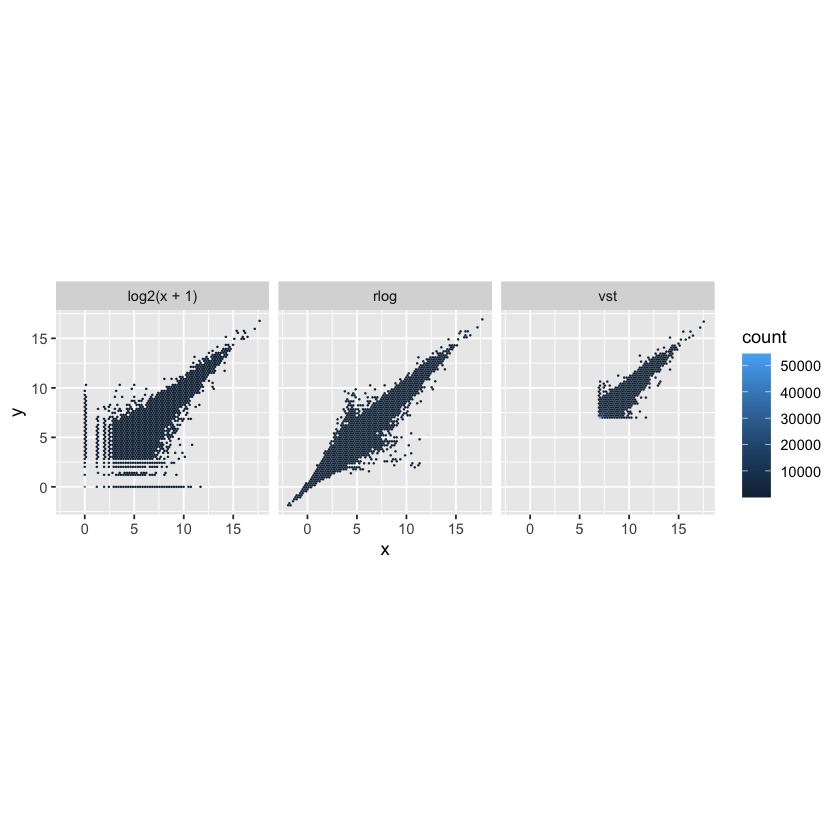

In [24]:
dds <- estimateSizeFactors(dds)

df <- bind_rows(
  as_data_frame(log2(counts(dds, normalized=TRUE)[, 1:2]+1)) %>%
         mutate(transformation = "log2(x + 1)"),
  as_data_frame(assay(vsd)[, 1:2]) %>% mutate(transformation = "vst"),
  as_data_frame(assay(rld)[, 1:2]) %>% mutate(transformation = "rlog"))
  
colnames(df)[1:2] <- c("x", "y")  

ggplot(df, aes(x = x, y = y)) + geom_hex(bins = 80) +
  coord_fixed() + facet_grid( . ~ transformation)  

* **Compute Euclidean sample distances**

> * Transpose dataset & coerce into matrix

In [25]:
sampleDists <- dist(t(assay(vsd)))
sampleDists

         S3_3_2_1 S3_3_2_6 S3_3_2_2 S3_1_2_2 S3_1_2_4 S3_1_2_6 S3_2_2_3
S3_3_2_6 113.6741                                                      
S3_3_2_2 119.0132 109.1121                                             
S3_1_2_2 130.1827 137.1645 138.4985                                    
S3_1_2_4 122.3200 121.6938 115.8733 107.0735                           
S3_1_2_6 145.5942 148.2456 148.9492 133.7203 118.1835                  
S3_2_2_3 145.4904 140.8349 137.4242 141.1246 109.5468 135.3545         
S3_2_2_6 128.5395 119.8612 127.2459 111.8354 110.9333 135.6028 129.4378
S3_2_2_1 129.9094 125.1811 128.3208 105.5089 102.5841 123.7129 127.4259
         S3_2_2_6
S3_3_2_6         
S3_3_2_2         
S3_1_2_2         
S3_1_2_4         
S3_1_2_6         
S3_2_2_3         
S3_2_2_6         
S3_2_2_1 104.5829

* **Visualize sample distances with heatmap using Euclidean distances**

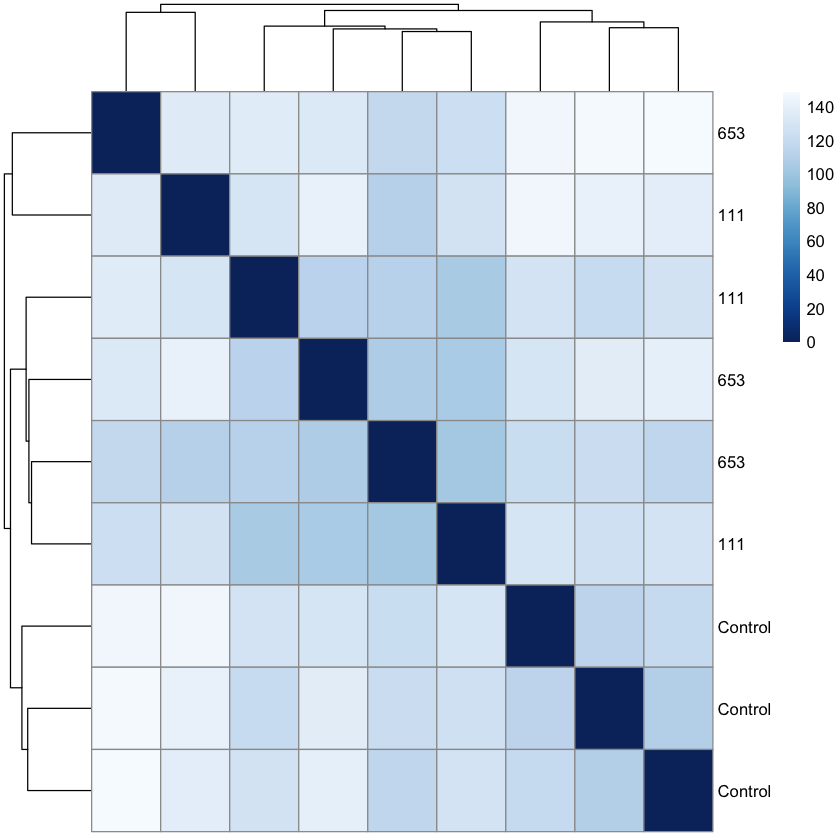

In [26]:
sampleDistMatrix <- as.matrix( sampleDists )
rownames(sampleDistMatrix) <- paste( vsd$group)
colnames(sampleDistMatrix) <- NULL
colors <- colorRampPalette(rev(brewer.pal(9, "Blues")))(255)
pheatmap(sampleDistMatrix,
         clustering_distance_rows = sampleDists,
         clustering_distance_cols = sampleDists,
         cluster_rows=T, cluster_cols=T,
         col = colors)

* **Compute Poisson distances (Witten 2011)**

> * Distances

In [27]:
poisd <- PoissonDistance(t(counts(dds)))

* **Visualize sample distances with heatmap using Poisson distances**

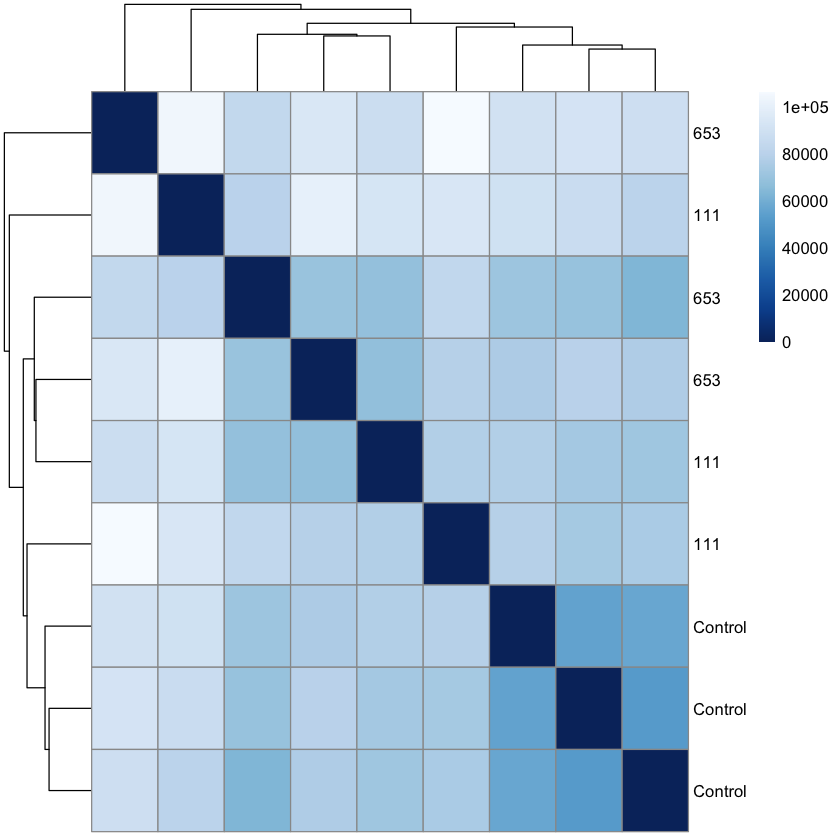

In [28]:
samplePoisDistMatrix <- as.matrix( poisd$dd )
rownames(samplePoisDistMatrix) <- paste( dds$group, sep=" - " )
colnames(samplePoisDistMatrix) <- NULL
pheatmap(samplePoisDistMatrix,
         clustering_distance_rows = poisd$dd,
         clustering_distance_cols = poisd$dd,
         col = colors)

* **Visualize sample-to-sample differences with pricipal components analysis (PCA)**

> * PCA with DESeq2

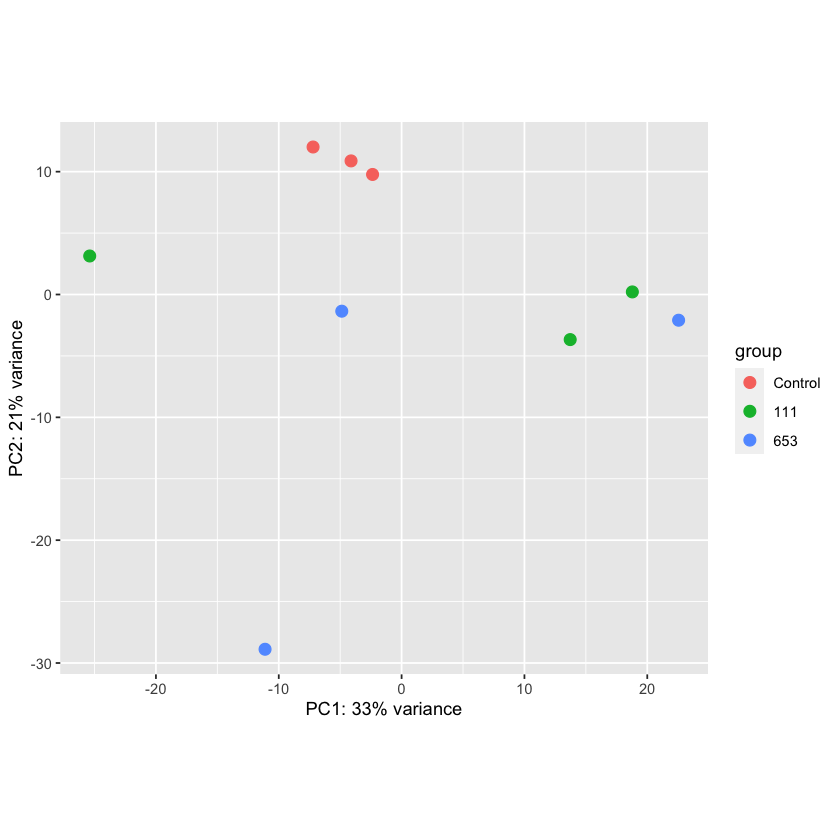

In [29]:
plotPCA(vsd, intgroup = c("group"))

> * PCA with ggplot2

> * View PCs

In [30]:
pcaData <- plotPCA(vsd, intgroup = c( "group"), returnData = TRUE)
pcaData

,PC1,PC2,group,group.1,name
,<dbl>,<dbl>,<fct>,<fct>,<fct>
S3_3_2_1,-4.114987,10.8768279,Control,Control,S3_3_2_1
S3_3_2_6,-7.207155,12.0081714,Control,Control,S3_3_2_6
S3_3_2_2,-2.363462,9.7728040,Control,Control,S3_3_2_2
S3_1_2_2,22.551882,-2.0934171,653,653,S3_1_2_2
S3_1_2_4,-4.870542,-1.3587401,653,653,S3_1_2_4
S3_1_2_6,-11.116015,-28.8808218,653,653,S3_1_2_6
S3_2_2_3,-25.390405,3.1356008,111,111,S3_2_2_3
S3_2_2_6,18.784849,0.2104845,111,111,S3_2_2_6
S3_2_2_1,13.725835,-3.6709096,111,111,S3_2_2_1


> * Express variation explained to percentage

In [31]:
percentVar <- round(100 * attr(pcaData, "percentVar"))

> * Plot data

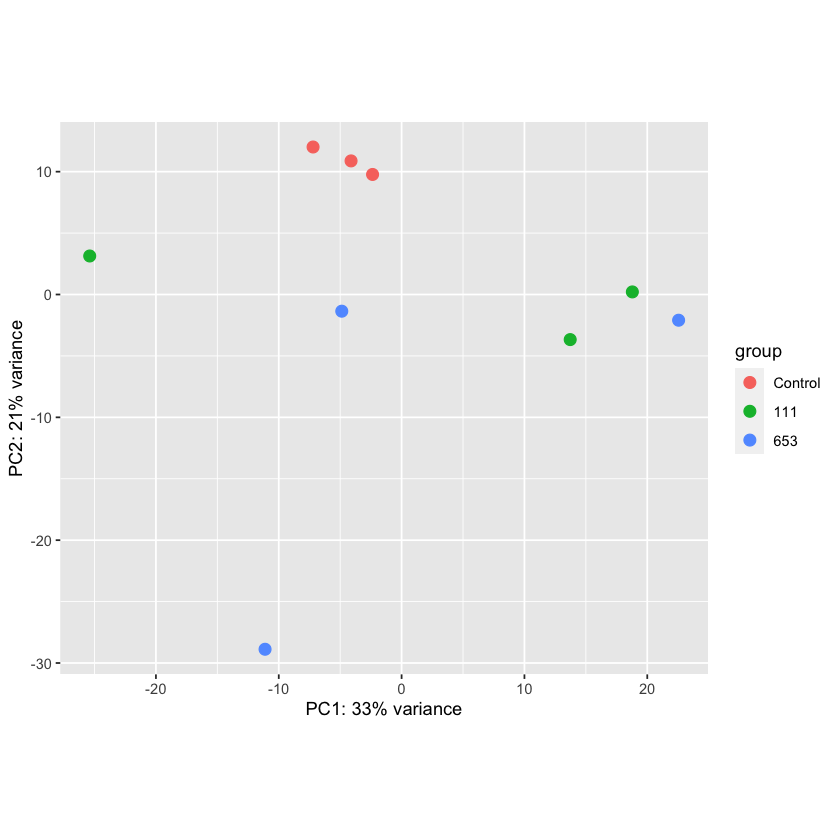

In [32]:
ggplot(pcaData, aes(x = PC1, y = PC2, color = group)) +
  geom_point(size =3) +
  xlab(paste0("PC1: ", percentVar[1], "% variance")) +
  ylab(paste0("PC2: ", percentVar[2], "% variance")) +
  coord_fixed()

* **Visualize sample-to-sample differences with multidimensional scaling (MDS)**

> * VSD data

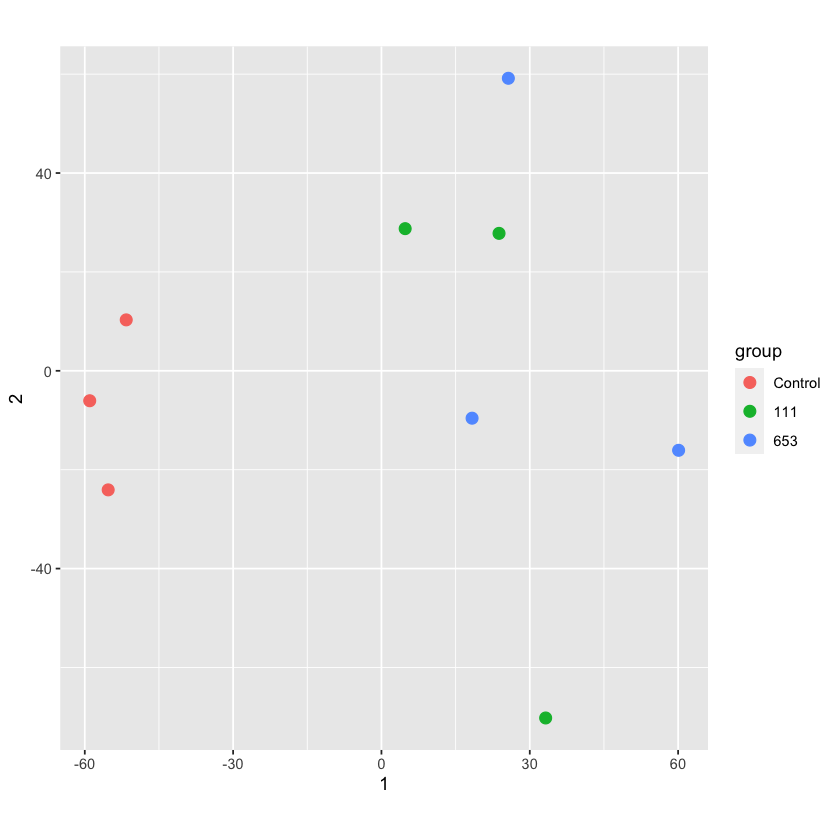

In [33]:
mds <- as.data.frame(colData(vsd))  %>%
         cbind(cmdscale(sampleDistMatrix))
ggplot(mds, aes(x = `1`, y = `2`, color = group)) +
  geom_point(size = 3) + coord_fixed()

> * Poisson data

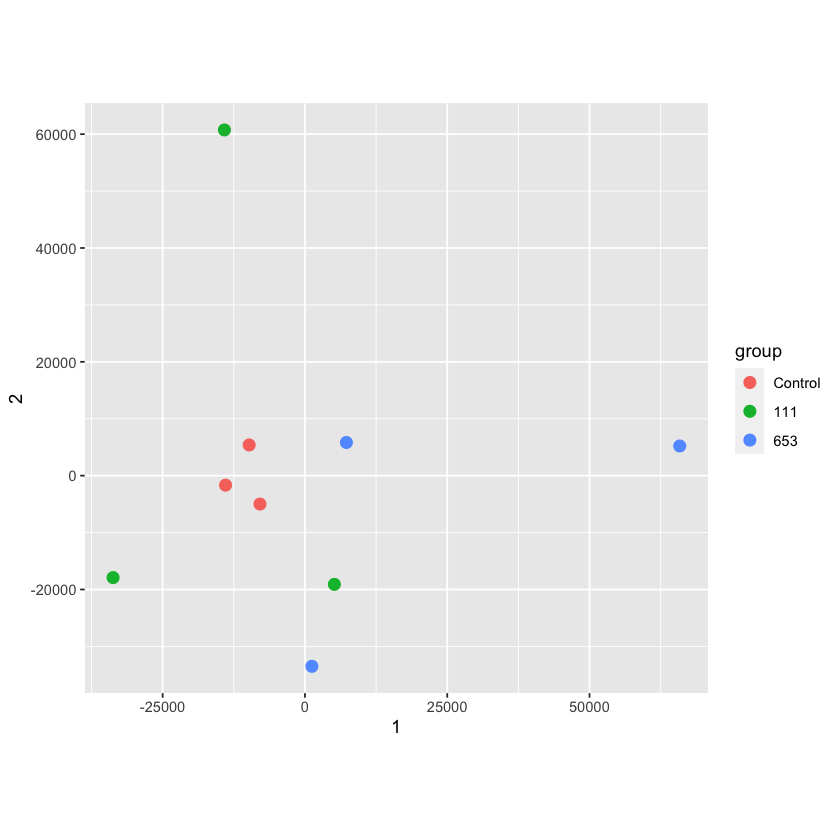

In [34]:
mdsPois <- as.data.frame(colData(dds)) %>%
   cbind(cmdscale(samplePoisDistMatrix))
ggplot(mdsPois, aes(x = `1`, y = `2`, color = group)) +
  geom_point(size = 3) + coord_fixed()

### Diagnostics<a class="anchor" id="nineth-q"></a>  
[Back to Table of Contents](#toc-q)

### Parametric analysis: differential expression analysis<a class="anchor" id="tenth-q"></a>  
[Back to Table of Contents](#toc-q)

* **Identify differentially expressed genes with raw count data**

In [35]:
dds <- DESeq(dds)

using pre-existing size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



* **Tabulate results, set $\alpha = 0.05$**
* **Adjust $p$-values with Benjamini & Hochberg (1995) to account for false discoveries**
* **Shrink/deflate effect sizes (Log fold change estimates)**

> * Contrast control vs 653

In [36]:
Cv653 = results(dds, contrast=c("group","653","Control"),
                independentFiltering=TRUE, alpha=0.001, pAdjustMethod="BH", parallel=TRUE)
Cv653 = lfcShrink(dds, contrast=c("group","653","Control"), res=Cv653)

using 'normal' for LFC shrinkage, the Normal prior from Love et al (2014).

Note that type='apeglm' and type='ashr' have shown to have less bias than type='normal'.
See ?lfcShrink for more details on shrinkage type, and the DESeq2 vignette.
Reference: https://doi.org/10.1093/bioinformatics/bty895



> * Summary

In [37]:
summary(Cv653)


out of 211242 with nonzero total read count
adjusted p-value < 0.001
LFC > 0 (up)       : 1027, 0.49%
LFC < 0 (down)     : 502, 0.24%
outliers [1]       : 1882, 0.89%
low counts [2]     : 126086, 60%
(mean count < 14)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



> * Contrast control vs 111

In [38]:
Cv111 = results(dds, contrast=c("group","111","Control"),
                independentFiltering=TRUE, alpha=0.001, pAdjustMethod="BH", parallel=TRUE)
Cv111 = lfcShrink(dds, contrast=c("group","111","Control"), res=Cv111)

using 'normal' for LFC shrinkage, the Normal prior from Love et al (2014).

Note that type='apeglm' and type='ashr' have shown to have less bias than type='normal'.
See ?lfcShrink for more details on shrinkage type, and the DESeq2 vignette.
Reference: https://doi.org/10.1093/bioinformatics/bty895



> * Summary

In [39]:
summary(Cv111)


out of 211242 with nonzero total read count
adjusted p-value < 0.001
LFC > 0 (up)       : 589, 0.28%
LFC < 0 (down)     : 630, 0.3%
outliers [1]       : 1882, 0.89%
low counts [2]     : 110157, 52%
(mean count < 8)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



> * Contrast 653 vs 111

In [40]:
i653v111 = results(dds, contrast=c("group","111","653"),
                independentFiltering=TRUE, alpha=0.001, pAdjustMethod="BH", parallel=TRUE)
i653v111 = lfcShrink(dds, contrast=c("group","111","653"), res=i653v111)

using 'normal' for LFC shrinkage, the Normal prior from Love et al (2014).

Note that type='apeglm' and type='ashr' have shown to have less bias than type='normal'.
See ?lfcShrink for more details on shrinkage type, and the DESeq2 vignette.
Reference: https://doi.org/10.1093/bioinformatics/bty895



> * Summary

In [41]:
summary(i653v111)


out of 211242 with nonzero total read count
adjusted p-value < 0.001
LFC > 0 (up)       : 43, 0.02%
LFC < 0 (down)     : 50, 0.024%
outliers [1]       : 1882, 0.89%
low counts [2]     : 98178, 46%
(mean count < 5)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



* **Subset gene with > or < log 2 fold change and $q$ value < 0.05 ($p$ value post FDR adjustment)**

> * First define the cutoffs for log2 fold differences and the $q$ value 

In [42]:
log2cutoff = 2
qvaluecutoff = 0.001

> * Concatenate results that are differentially expressed (>log2) and adjusted p-values < $q = 0.05$

In [43]:
diffXGenes <- unique(c(
  rownames(subset(Cv653, padj<=qvaluecutoff & abs(log2FoldChange)>=log2cutoff)),
  rownames(subset(Cv111, padj<=qvaluecutoff & abs(log2FoldChange)>=log2cutoff)),
  rownames(subset(i653v111, padj<=qvaluecutoff & abs(log2FoldChange)>=log2cutoff))))

> * Build assay object

In [44]:
heat <- assay(rld)[diffXGenes,]

* **Isolate genes for each comparison and sort by the log2 fold change estimates**

> * Down-regulated genes

In [45]:
resSig_Cv653 = subset(Cv653, padj < 0.001)# control vs 653

In [46]:
head(resSig_Cv653[ order(resSig_Cv653$log2FoldChange), ])

log2 fold change (MAP): group 653 vs Control 
Wald test p-value: group 653 vs Control 
DataFrame with 6 rows and 6 columns
                             baseMean    log2FoldChange             lfcSE
                            <numeric>         <numeric>         <numeric>
Cluster-15354.86688  523.460236390304 -6.22069875037002 0.409913333822945
Cluster-15354.125147 405.466867920865  -5.7493922589433 0.410971264693435
Cluster-15354.16367  94.4212875681078 -4.72631753655221 0.416745613312218
Cluster-15354.91585  421.196286280553 -4.52496365589453 0.436083130068858
Cluster-15354.43585   36.840706027621 -4.50674691401847 0.488860840801369
Cluster-15354.84875  160.542512260478 -4.30191297107924 0.449443939561057
                                  stat               pvalue
                             <numeric>            <numeric>
Cluster-15354.86688  -9.81576585060432 9.63039131603062e-23
Cluster-15354.125147 -10.0710286216167 7.41979779976086e-24
Cluster-15354.16367  -7.79345520788518 6.5201

In [47]:
resSig_Cv111 = subset(Cv111, padj < 0.001)# control vs 111

In [48]:
head(resSig_Cv111[ order(resSig_Cv111$log2FoldChange), ])

log2 fold change (MAP): group 111 vs Control 
Wald test p-value: group 111 vs Control 
DataFrame with 6 rows and 6 columns
                             baseMean    log2FoldChange             lfcSE
                            <numeric>         <numeric>         <numeric>
Cluster-15354.43585   36.840706027621 -4.53623493772566 0.488539194086683
Cluster-15354.135436 73.0149999357432 -4.51375459366998 0.432950564426343
Cluster-15354.44072  91.1161562667943 -4.35484664156848 0.424996790236622
Cluster-15354.47671  82.6578522575621 -4.35334716995128 0.438051114975736
Cluster-15354.51991  51.1828007883665 -4.29193906518425 0.446498361580869
Cluster-15354.73058  23.3064477218463 -4.16049500804124 0.490629551291468
                                  stat               pvalue
                             <numeric>            <numeric>
Cluster-15354.43585  -7.04212143650835 1.89334699121883e-12
Cluster-15354.135436 -7.61041611279246 2.73214851584797e-14
Cluster-15354.44072  -6.82989699745686  8.497

In [49]:
resSig_653v111 = subset(i653v111, padj < 0.001)# 653 vs 111

In [50]:
head(resSig_653v111[ order(resSig_653v111$log2FoldChange), ])

log2 fold change (MAP): group 111 vs 653 
Wald test p-value: group 111 vs 653 
DataFrame with 6 rows and 6 columns
                             baseMean    log2FoldChange             lfcSE
                            <numeric>         <numeric>         <numeric>
Cluster-15354.44072  91.1161562667943 -4.93486727741021  0.42186345887301
Cluster-15354.47671  82.6578522575621  -4.6490692136691 0.435741178571344
Cluster-15354.135436 73.0149999357432 -4.51421704653765  0.43087993126884
Cluster-15354.9015   47.8944377845288 -4.01403728072526 0.459710890717266
Cluster-15354.51991  51.1828007883665 -3.78602195674483 0.445387166518038
Cluster-15354.57958  574.223137587342 -3.72012793818952 0.361233183643915
                                  stat               pvalue
                             <numeric>            <numeric>
Cluster-15354.44072  -7.36910755976977 1.71774033021444e-13
Cluster-15354.47671   -7.8168847737274 5.41466259149186e-15
Cluster-15354.135436 -7.61033193150618 2.733928707364

* **Up-regulated genes**

In [51]:
head(resSig_Cv653[ order(resSig_Cv653$log2FoldChange, decreasing = TRUE), ])# control vs 653

log2 fold change (MAP): group 653 vs Control 
Wald test p-value: group 653 vs Control 
DataFrame with 6 rows and 6 columns
                             baseMean   log2FoldChange             lfcSE
                            <numeric>        <numeric>         <numeric>
Cluster-15354.63552  144.445625864578  4.8266145262376 0.432940761920492
Cluster-15354.103410 119.391362931074 3.97164310416555  0.44777018843435
Cluster-15354.51831  48.6150089289578 3.31829800312056 0.470678620346354
Cluster-15354.104448 84.0455036947624 3.03194267391627 0.474408384610615
Cluster-15354.23044  20.1412248942779 2.91306347066058 0.459611804441928
Cluster-15354.65790  29.2738490443167 2.90999356550735 0.477730705125785
                                 stat               pvalue                 padj
                            <numeric>            <numeric>            <numeric>
Cluster-15354.63552  7.89372795898874 2.93291105086009e-15 5.22045056754314e-12
Cluster-15354.103410  7.1270983286481 1.0250686671962

In [52]:
head(resSig_Cv111[ order(resSig_Cv111$log2FoldChange, decreasing = TRUE), ])# control vs 111

log2 fold change (MAP): group 111 vs Control 
Wald test p-value: group 111 vs Control 
DataFrame with 6 rows and 6 columns
                             baseMean   log2FoldChange             lfcSE
                            <numeric>        <numeric>         <numeric>
Cluster-15354.103410 119.391362931074 4.15883472608291 0.447562460572718
Cluster-15354.63552  144.445625864578 3.98912380518576 0.433553034331932
Cluster-15354.91015   36.026260597125 3.65356890229054 0.494713412151231
Cluster-15354.104448 84.0455036947624 3.51565430808709  0.47406150802417
Cluster-46783.1      21.6142579885204 3.08204893866315 0.475582811515273
Cluster-15354.45591  53.2139331539351 3.05662290244804 0.482775827654948
                                 stat               pvalue                 padj
                            <numeric>            <numeric>            <numeric>
Cluster-15354.103410  7.3052754206496 2.76699373051323e-13 4.09601928191418e-10
Cluster-15354.63552  7.11137996260781 1.1488836037784

In [53]:
head(resSig_653v111[ order(resSig_653v111$log2FoldChange, decreasing = TRUE), ])# 653 vs 111

log2 fold change (MAP): group 111 vs 653 
Wald test p-value: group 111 vs 653 
DataFrame with 6 rows and 6 columns
                             baseMean   log2FoldChange             lfcSE
                            <numeric>        <numeric>         <numeric>
Cluster-15354.86688  523.460236390304 6.16684209559301 0.409526835505501
Cluster-15354.91585  421.196286280553 6.06007886199007 0.434820041896546
Cluster-15354.125147 405.466867920865 5.66880155661036 0.410499752189245
Cluster-15354.16367  94.4212875681078 5.07416117824374 0.413910478830619
Cluster-15354.84875  160.542512260478  4.7878609199989 0.448216621901864
Cluster-15354.13929  193.202208627245 4.78020951376816  0.45252201719455
                                 stat               pvalue                 padj
                            <numeric>            <numeric>            <numeric>
Cluster-15354.86688   9.7659202345643 1.57673989400085e-22 4.38262737237006e-18
Cluster-15354.91585  9.81391726905741 9.80852611321812e-23 3.

**Build Table of DEGs**

Bind all DEGs from each comparisons, by rows

In [54]:
DEGs=rbind(c(resSig_Cv653@rownames,
             resSig_Cv111@rownames,
             resSig_653v111@rownames))

IDs

In [55]:
ID=rep(c("Cv653", "Cv111", "653v111"),
               c(length(resSig_Cv653@rownames),
                length(resSig_Cv111@rownames),
                length(resSig_653v111@rownames)))

Bind DEGs and IDs by column

In [56]:
DEGS=data.frame(as.character(DEGs),ID)

Rename Columns

In [57]:
colnames(DEGS) = c("Gene_ID","Comparison") 

Sanity Checks

In [58]:
length(DEGS$Gene_ID)==length(ID)

[1] TRUE

In [59]:
length(resSig_Cv653@rownames)

[1] 1529

In [60]:
length(resSig_Cv111@rownames)

[1] 1219

In [61]:
length(resSig_653v111@rownames)

[1] 93

In [62]:
length(DEGS$Gene_ID) == length(resSig_Cv653@rownames)+length(resSig_Cv111@rownames)+length(resSig_653v111@rownames)

[1] TRUE

Write data into table

In [227]:
write.csv(DEGS, 
          file="Brassica_DEGs.csv")

**Merge Gene Names with DEGs**

Create column with rownames

In [63]:
Cv653$id <- rownames(Cv653)
Cv111$id <- rownames(Cv111)
i653v111$id <- rownames(i653v111)

Merge data tables

In [64]:
Cv653_GeneNames <- merge(as(Cv653,"data.frame"), gnDF, by="id")
Cv111_GeneNames <- merge(as(Cv111,"data.frame"), gnDF, by="id")
i653v111_GeneNames <- merge(as(i653v111,"data.frame"), gnDF, by="id")

Check for unique genes between two datasets

In [65]:
diffXGenes[!(diffXGenes %in% DEGS$Gene_ID)]

character(0)

Where is the biggest change?

In [78]:
max(abs(Cv653_GeneNames$log2FoldChange))
max(abs(Cv111_GeneNames$log2FoldChange))
max(abs(i653v111_GeneNames$log2FoldChange))

[1] 6.220699

[1] 4.536235

[1] 6.166842

### Visualization<a class="anchor" id="eleventh-q"></a>  
[Back to Table of Contents](#toc-q)

**MA plot**

> * Control vs. 653

In [55]:
setwd("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES")

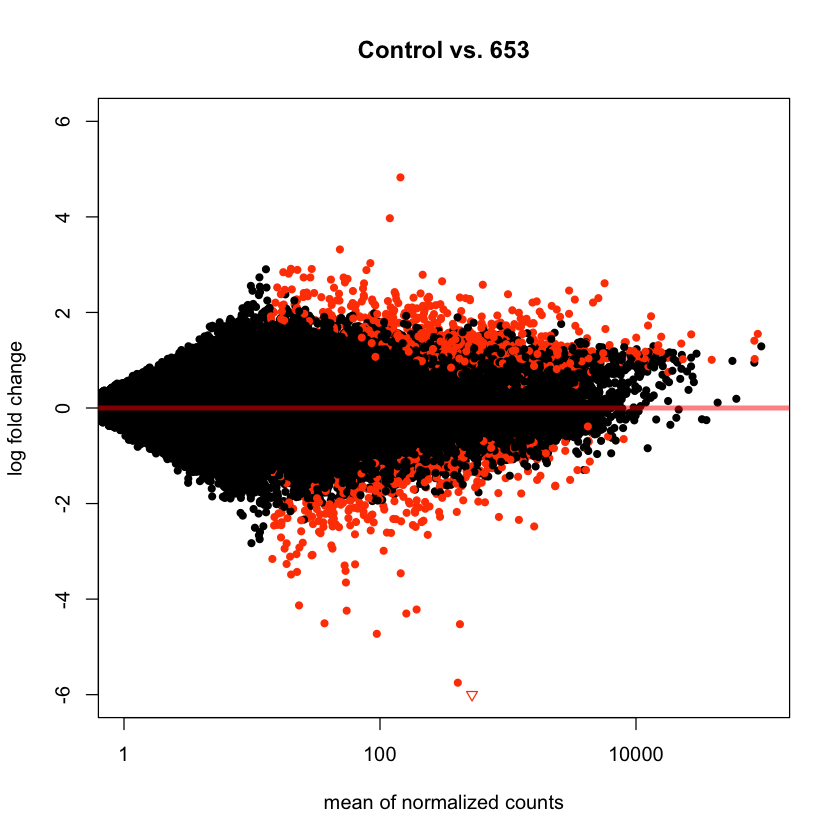

In [58]:
#tiff("Mustard_MA-P_Cv653.tiff", width=5, height=5, units='in', res=300)
xlim <- c(1,1e5); ylim <- c(-6,6)
DESeq2::plotMA(Cv653, 
                  xlim=xlim, ylim=ylim,
                  cex=0.9, alpha = 0.001,
                  main="Control vs. 653",
                  colNonSig="black",colSig="orangered1")
#dev.off()

> * 111 vs control

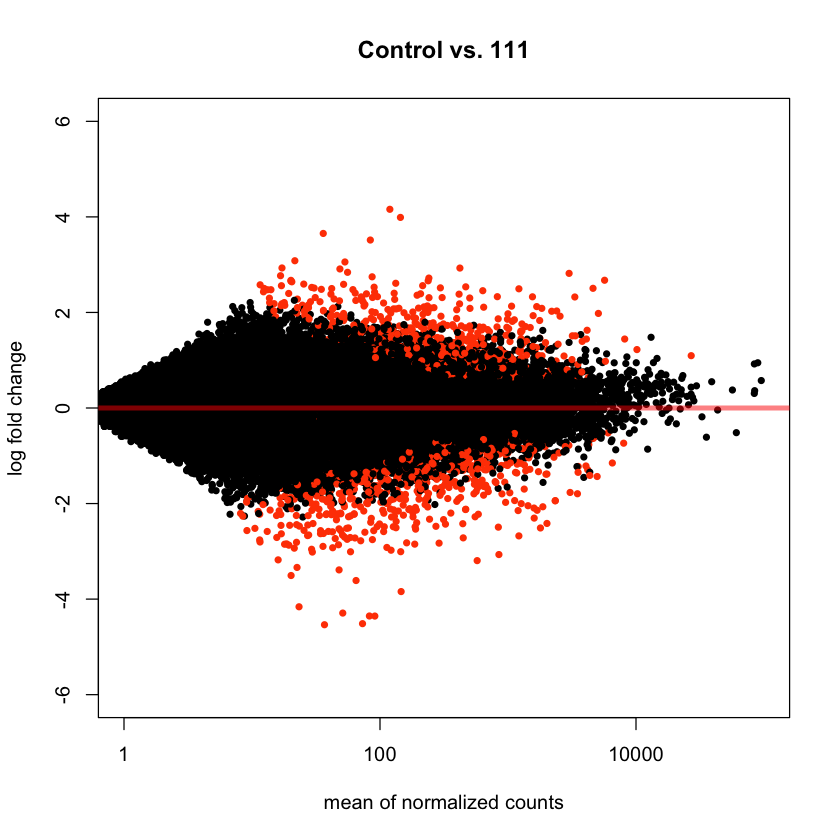

In [61]:
#tiff("Mustard_MA-P_Cv111.tiff", width=5, height=5, units='in', res=300)
xlim <- c(1,1e5); ylim <- c(-6,6)
DESeq2::plotMA(Cv111,
                xlim=xlim, ylim=ylim,
                cex=0.8, alpha = 0.001,
                main="Control vs. 111",
                colNonSig="black",colSig="orangered1")
#dev.off()

> * 111 vs. 653

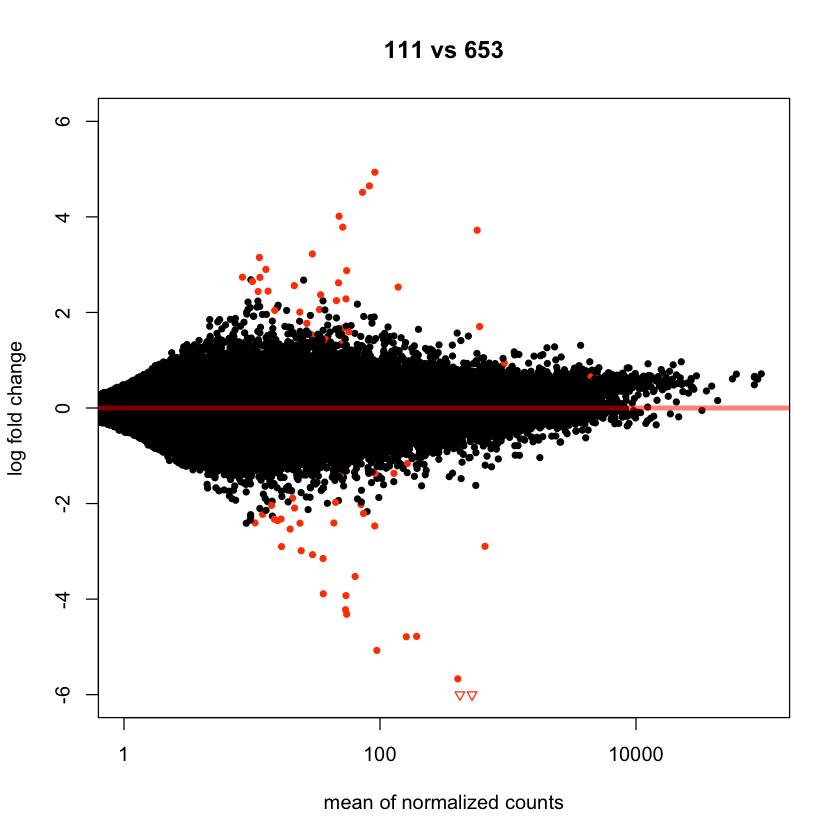

In [64]:
#tiff("Mustard_MA-P_111v653.tiff", width=5, height=5, units='in', res=300)
xlim <- c(1,1e5); ylim <- c(-6,6)
DESeq2::plotMA(i653v111,
                xlim=xlim, ylim=ylim,
                cex=0.8, alpha = 0.001,
                main="111 vs 653",
                colNonSig="black",colSig="orangered1")
#dev.off()

**Histograms of $p$-values**

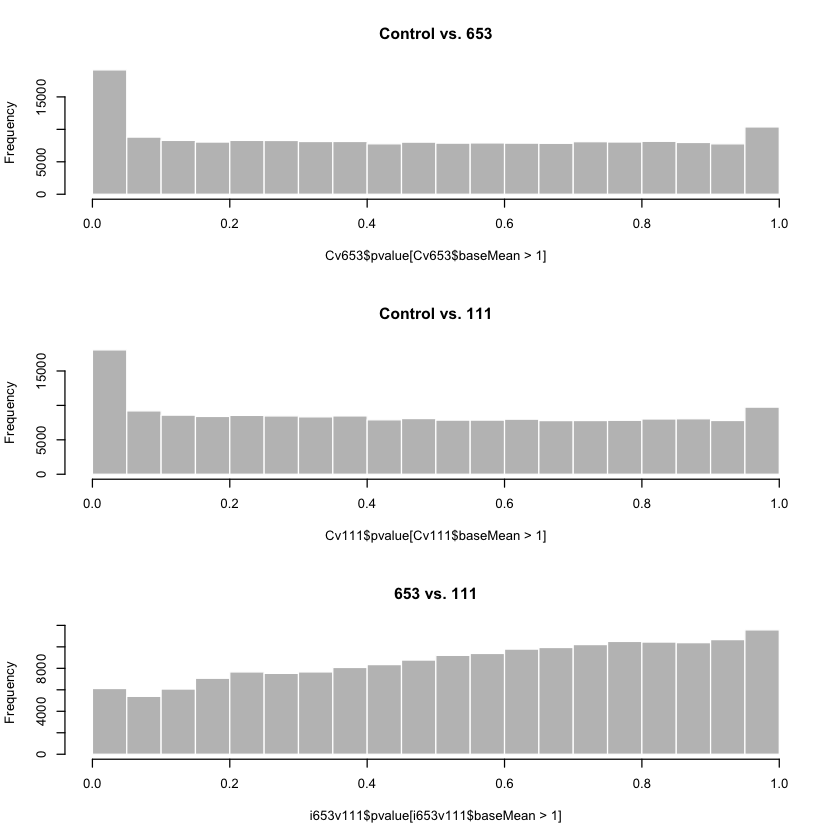

In [65]:
par(mfrow=c(3,1))
hist(Cv653$pvalue[Cv653$baseMean > 1], breaks = 0:20/20,
     col = "grey75", border = "white", main = "Control vs. 653")
hist(Cv111$pvalue[Cv111$baseMean > 1], breaks = 0:20/20,
     col = "grey75", border = "white", main = "Control vs. 111")
hist(i653v111$pvalue[i653v111$baseMean > 1], breaks = 0:20/20,
     col = "grey75", border = "white", main = "653 vs. 111")

**Volcano plots**

> * 653 vs control

In [66]:
Cv653_gn = subset(Cv653_GeneNames, Comparison == "Cv653")

* Order genes by fold change values

In [67]:
Cv653_gn = (Cv653_gn[order(-abs(Cv653_gn$log2FoldChange)),])

Convert 10 DEG gene names from factors to vectors

In [68]:
labs = head(Cv653_gn$Hit1_acc, n=20)
lab = as.character(labs)
lab
labels = c('-','-','CCA1_ARATH','-','UVB31_ARATH','PDRP2_ARATH','Y8359_ORYSI','-','-',
           'TMN4_ARATH','-','-','GCN2_ARATH','-','-','PFPB1_ARATH','ATU_DROME','-','PUB4_ARATH','Y2921_ARATH')

[1] "-"           "-"           "CCA1_ARATH"  "-"           "UVB31_ARATH"
 [6] "PDRP2_ARATH" "Y8359_ORYSI" "-"           "-"           "TMN4_ARATH" 
[11] "-"           "-"           "GCN2_ARATH"  "-"           "-"          
[16] "PFPB1_ARATH" "ATU_DROME"   "-"           "PUB4_ARATH"  "Y2921_ARATH"

Warning message in EnhancedVolcano(Cv653_GeneNames, lab = NA, x = "log2FoldChange", :
“transcriptPointSize argument deprecated in v1.4 - please use pointSize”
Warning message in EnhancedVolcano(Cv653_GeneNames, lab = NA, x = "log2FoldChange", :
“transcriptLabSize argument deprecated in v1.4 - please use labSize”
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



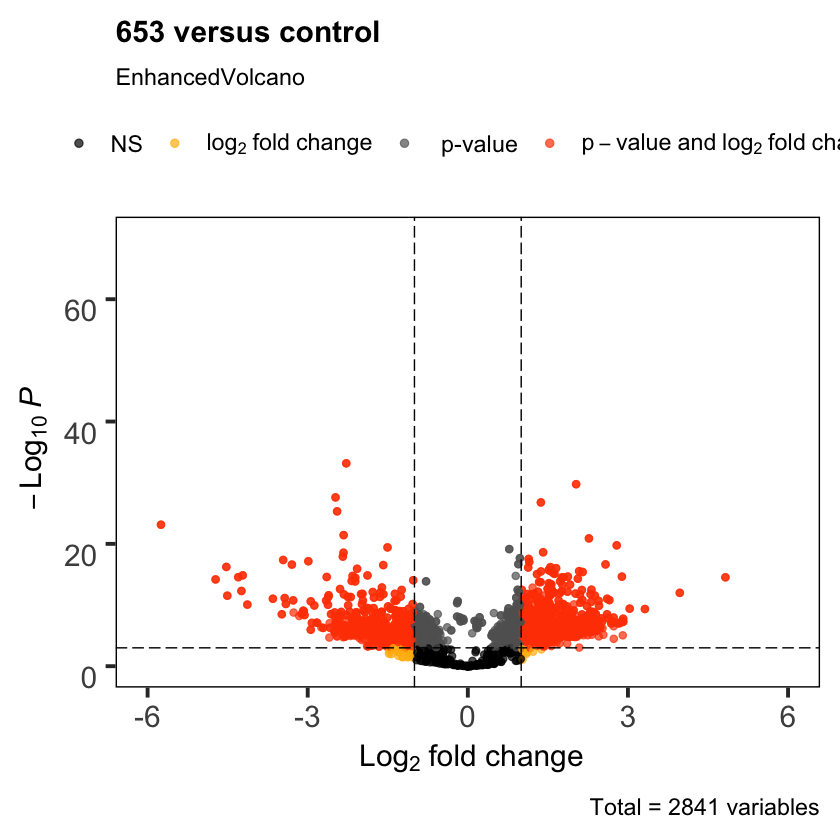

In [71]:
#tiff("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Mustard/Mustard_VP_Cv653.tiff",
  #width=10, height=10, units='in', res=300)

Cv6=EnhancedVolcano(Cv653_GeneNames,
    lab = NA,
    x = 'log2FoldChange',
    y = 'pvalue',
    title = "653 versus control",
    legend=c("NS","Log2 fold-change","p-value",
    "p-value & Log2 fold-change"),
    legendPosition = "top",
    legendLabSize = 14,
    legendIconSize = 2.0,
    pCutoff = 0.001,
    FCcutoff = 1.0,
    transcriptPointSize = 1.75,
    transcriptLabSize = 3.0,
    colAlpha = 0.7,
    border = "full",
    gridlines.major = FALSE,
    gridlines.minor = FALSE,          
    xlim = c(-6, 6),
    ylim = c(0, 70),
    col=c("black", "darkgoldenrod1", "gray38", "orangered1"))

Cv6 + scale_color_manual(
  values=c(
    NS="black",
    FC="darkgoldenrod1",
    P="gray38",
    FC_P="orangered1"),
  labels=c(
    NS='NS',
    FC=expression(log[2]~fold~change),
    P="p-value",
    FC_P=expression(p-value~and~log[2]~fold~change)))

#dev.off()

In [70]:
setwd("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES")

In [84]:
tiff("Mustard_VP_Cv653.tiff", width=10, height=10, units='in', res=300)
Cv6
dev.off()

pdf 
  2

> * 111 vs control

Warning message in EnhancedVolcano(Cv111, lab = NA, x = "log2FoldChange", y = "pvalue", :
“transcriptPointSize argument deprecated in v1.4 - please use pointSize”
Warning message in EnhancedVolcano(Cv111, lab = NA, x = "log2FoldChange", y = "pvalue", :
“transcriptLabSize argument deprecated in v1.4 - please use labSize”
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



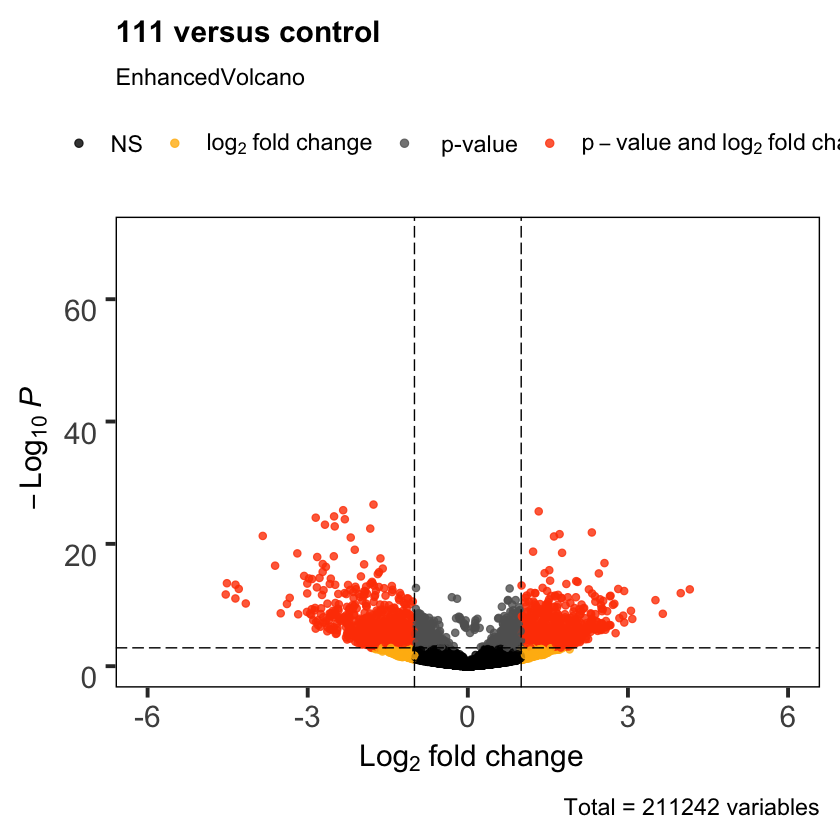

In [72]:
# tiff("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Mustard/Mustard_VP_Cv111.tiff",
#     width=10, height=10, units='in', res=300)

Cv1=EnhancedVolcano(Cv111,
    lab = NA,
    x = 'log2FoldChange',
    y = 'pvalue',
    title = "111 versus control",
    legend=c("NS","Log2 fold-change","p-value",
    "p-value & Log2 fold-change"),
    legendPosition = "top",
    legendLabSize = 14,
    legendIconSize = 2.0,
    pCutoff = 0.001,
    FCcutoff = 1.0,
    transcriptPointSize = 1.75,
    transcriptLabSize = 3.0,
    colAlpha = 0.8,
    border = "full",
    gridlines.major = FALSE,
    gridlines.minor = FALSE,
    xlim = c(-6, 6),
    ylim = c(0, 70),
    col=c("black", "darkgoldenrod1", "gray38", "orangered1"))
Cv1 + scale_color_manual(
  values=c(
    NS="black",
    FC="darkgoldenrod1",
    P="gray38",
    FC_P="orangered1"),
  labels=c(
    NS='NS',
    FC=expression(log[2]~fold~change),
    P="p-value",
    FC_P=expression(p-value~and~log[2]~fold~change)))

#dev.off()

> * 653 vs. 111

Warning message in EnhancedVolcano(i653v111, lab = NA, x = "log2FoldChange", y = "pvalue", :
“transcriptPointSize argument deprecated in v1.4 - please use pointSize”
Warning message in EnhancedVolcano(i653v111, lab = NA, x = "log2FoldChange", y = "pvalue", :
“transcriptLabSize argument deprecated in v1.4 - please use labSize”
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



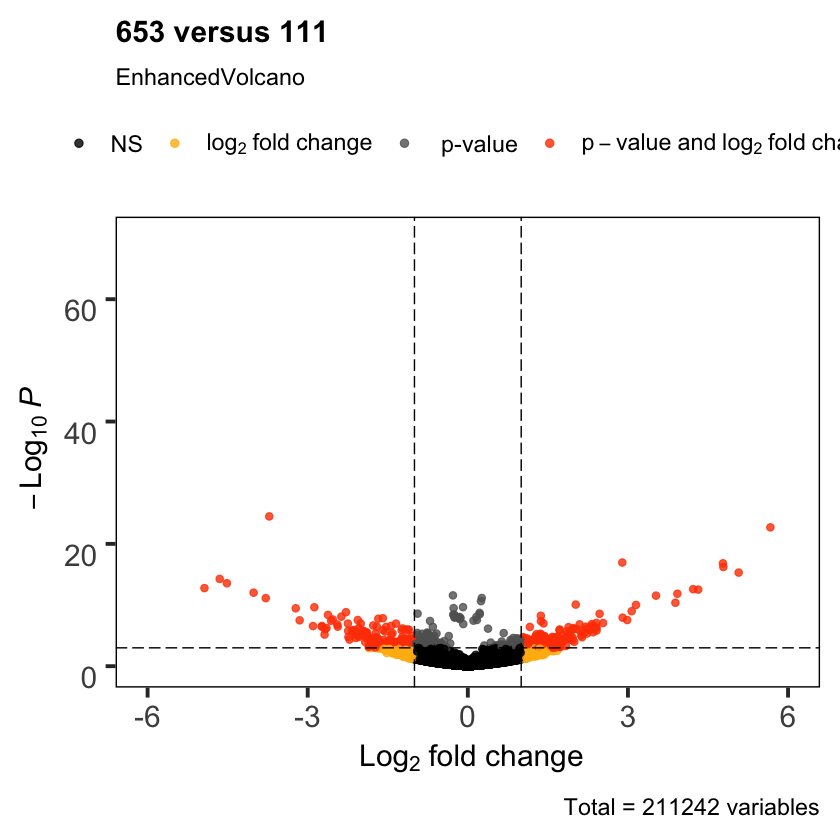

In [73]:
# tiff("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Mustard/Mustard_VP_653v111.tiff",
#  width=10, height=10, units='in', res=300)

i6vi1=EnhancedVolcano(i653v111,
    lab = NA,
    x = 'log2FoldChange',
    y = 'pvalue',
    title = "653 versus 111",
    legend=c("NS","Log2 fold-change","p-value",
    "p-value & Log2 fold-change"),
    legendPosition = "top",
    legendLabSize = 14,
    legendIconSize = 2.0,
    pCutoff = 0.001,
    FCcutoff = 1.0,
    transcriptPointSize = 1.75,
    transcriptLabSize = 3.0,
    colAlpha = 0.8,
    border = "full",
    gridlines.major = FALSE,
    gridlines.minor = FALSE,
    xlim = c(-6, 6),
    ylim = c(0, 70),
    col=c("black", "darkgoldenrod1", "gray38", "orangered1"))
i6vi1 + scale_color_manual(
  values=c(
    NS="black",
    FC="darkgoldenrod1",
    P="gray38",
    FC_P="orangered1"),
  labels=c(
    NS='NS',
    FC=expression(log[2]~fold~change),
    P="p-value",
    FC_P=expression(p-value~and~log[2]~fold~change)))

#dev.off()

**Cluster Genes**

Heatmap I

Are there any duplicate genes?

In [151]:
table_all[,7][duplicated(table_all[,7])]

[1] "Cluster-15354.103410" "Cluster-15354.63552"  "Cluster-15354.104448"
 [4] "Cluster-15354.43585"  "Cluster-15354.86688"  "Cluster-15354.91585" 
 [7] "Cluster-15354.125147" "Cluster-15354.16367"  "Cluster-15354.51991" 
[10] "Cluster-15354.135436" "Cluster-15354.47671"  "Cluster-15354.44072"

Number of unique genes

In [152]:
length(unique(table_all[,7]))

[1] 18

Remove duplicate genes

In [153]:
degs = table_all[!duplicated(table_all[,7]),]

Object for heatmap

In [154]:
heat <- assay(vsd)[degs[,7],]

Convert to dataframe

In [155]:
hmDF = data.frame(heat)

Confirm Order

In [156]:
rownames(hmDF) == degs[,7]

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[16] TRUE TRUE TRUE

Find indices of unknown genes

In [157]:
rownames(hmDF)[which(degs[,6] == "-")]

[1] "Cluster-15354.103410" "Cluster-15354.16367"  "Cluster-15354.125147"
[4] "Cluster-15354.86688"  "Cluster-15354.91015"  "Cluster-15354.44072" 
[7] "Cluster-15354.135436" "Cluster-15354.9015"

Replace dashes with mRNA names

- Index objects

In [158]:
Index = degs[,6] == "-"

- Convert to character to solve NA problem

In [159]:
degs[,6] = as.character(degs[,6])

- Replace NAs with fragment names

In [160]:
degs[,6][Index] = rownames(hmDF)[Index]

Replace rownames in heatmap object with gene names

In [161]:
length(unique(degs[,6])) == length(degs[,6])

[1] TRUE

Replace rownames in heatmap object with gene names

In [162]:
length(rownames(hmDF))

[1] 18

In [163]:
rownames(hmDF) = degs[,6]

In [164]:
rownames(hmDF)

[1] "CCA1_ARATH"           "Cluster-15354.103410" "NUP1_ARATH"          
 [4] "LAG13_ARATH"          "TRL11_ARATH"          "PDRP2_ARATH"         
 [7] "UVB31_ARATH"          "Cluster-15354.16367"  "Cluster-15354.125147"
[10] "Cluster-15354.86688"  "Cluster-15354.91015"  "CIA30_ARATH"         
[13] "GLYC7_ARATH"          "SCL1_ARATH"           "Cluster-15354.44072" 
[16] "Cluster-15354.135436" "Y8359_ORYSI"          "Cluster-15354.9015"

Reorder genes

In [171]:
ord_row_labs = rownames(hmDF)[(Mustard_DEGs$tree_row$order)]

In [172]:
row_labs = cat(paste0('"', paste(ord_row_labs, collapse="\", \""), '"'))

"Cluster-15354.16367", "Y8359_ORYSI", "UVB31_ARATH", "Cluster-15354.125147", "Cluster-15354.86688", "PDRP2_ARATH", "Cluster-15354.9015", "GLYC7_ARATH", "Cluster-15354.135436", "SCL1_ARATH", "Cluster-15354.44072", "NUP1_ARATH", "CCA1_ARATH", "Cluster-15354.103410", "Cluster-15354.91015", "CIA30_ARATH", "LAG13_ARATH", "TRL11_ARATH"

Italicize names

In [169]:
newnames <- lapply(
  rownames(hmDF),
  function(x) bquote(italic(.(x))))

Heatmap

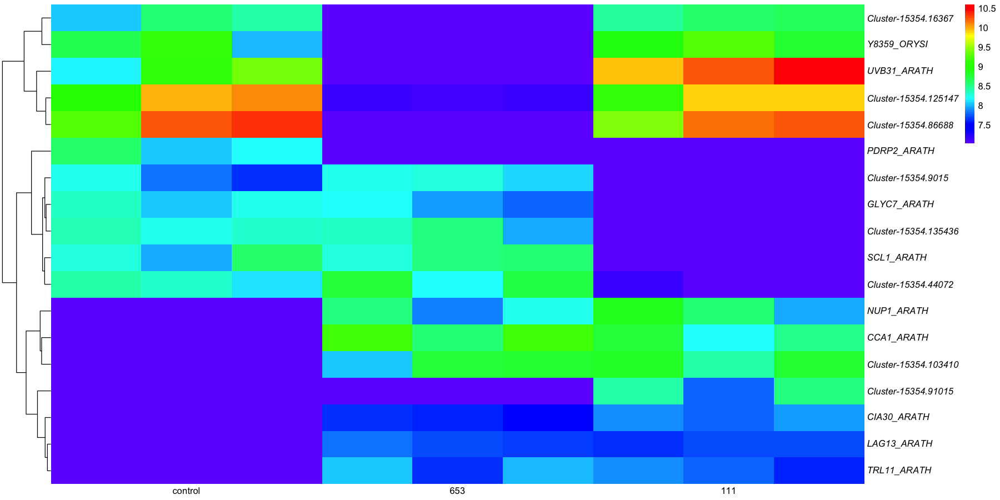

In [352]:
options(repr.plot.width=15, repr.plot.height=7.5)
Mustard_DEGs=pheatmap(hmDF,
        color= rev(rainbow(96,start=0.0,end=0.74,alpha=1)),#,s=1,v=0.6,start=0.5,end=0.01),
        border_color = NA,
        cluster_cols=F,
        show_colnames = TRUE,
        show_rownames = TRUE,
        labels_col=paste0(c("","control"," ","","653"," ", "","111"," ")),
        angle_col=0,
        labels_row = as.expression(newnames))

In [353]:
tiff("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Mustard/Mustard_HeatMap_1.tiff", 
     width = 8, height = 5, units = 'in', res = 300)
Mustard_DEGs
dev.off()

pdf 
  2

Heatmap II

In [75]:
heat <- assay(vsd)[diffXGenes,]

Convert to dataframe

In [76]:
hmDF = data.frame(heat)

Extract subset of genenames that are differentially expressed

* First, make new column of character gene IDs

In [77]:
gnDF["ID"] = as.character(gnDF$id)

* Differentially expressed genes

In [78]:
degs = subset(gnDF, gnDF$ID %in% rownames(hmDF))

* Use only unique/non duplicated rows

In [79]:
degs = degs[!duplicated(degs$ID),]

* Sanity checks

In [80]:
length(degs$ID) == length(rownames(hmDF))

[1] TRUE

In [81]:
class(degs$ID) == class(rownames(hmDF))

[1] TRUE

* Reorder rows of both dataframes to align with each other

In [82]:
hmDF <- hmDF[with(hmDF, order(rownames(hmDF))), ]

In [83]:
degs <- degs[with(degs, order(degs$ID)), ]

* Sanity check

In [84]:
rownames(hmDF) == degs$ID

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [16] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [31] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [46] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [61] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [76] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [91] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[106] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[121] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[136] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[151] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[166] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[181] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[196] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[211] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[226] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[241] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[256] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[271] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[286] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[301] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[316] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[331] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[346] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[361] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[376] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE

Convert dataframe to matrix

In [85]:
hmdf = as.matrix(hmDF)

Replace rownames in heatmap object with gene names

In [86]:
rownames(hmdf) <- degs$Hit1_acc

Order row labels to italicize

In [88]:
ord_row_labs = rownames(hmdf)[(Mustard_DEGs$tree_row$order)]

In [89]:
ord_row_labs = cat(paste0('"', paste(ord_row_labs, collapse="\", \""), '"'))

"-", "-", "SCL1_ARATH", "MRS21_ARATH", "-", "MRS21_ARATH", "-", "GLYC7_ARATH", "BGH3_HUMAN", "CYSG_PSEA6", "-", "C70B3_ARATH", "Y1137_ARATH", "SOX2_HUMAN", "CADH2_HUMAN", "RBS_BETPN", "NEF_HV1SC", "RBS_BETPN", "-", "BXL1_ARATH", "ODBA1_ARATH", "Y305_SYNY3", "AB27G_ARATH", "ALG2_DICDI", "WTR16_ARATH", "FBK27_ARATH", "SRP68_CANLF", "RRC1_ARATH", "POLX_TOBAC", "EI2BE_DICDI", "-", "CCB23_ARATH", "GLYC7_ARATH", "NRT24_ARATH", "HSFA2_ARATH", "DTX50_ARATH", "HSFA2_ARATH", "CLPB1_ARATH", "COPIA_DROME", "DNJB8_HUMAN", "HS174_ARATH", "TFL1_ARATH", "DAR4_ARATH", "LEA14_ARATH", "-", "HDHD3_MOUSE", "NET1D_ARATH", "-", "SRO5_ARATH", "STR17_ARATH", "PUB6_ARATH", "PCO1_ARATH", "-", "SRO5_ARATH", "GLE1_ARATH", "STAD_BRANA", "CLPB1_ARATH", "ALFC6_ARATH", "FLS_PETHY", "BH055_ARATH", "HFB2B_ARATH", "PRN1_ARATH", "SRO5_ARATH", "CSI1_ARATH", "-", "-", "ADH1_ARATH", "MCFJ_DICDI", "HSFA2_ARATH", "EFR3_CAEBR", "APE2_ARATH", "OBE3_ARATH", "-", "FTIP1_ARATH", "B3GTG_ARATH", "E70A1_ARATH", "E70B1_ARATH", "NRT26_A

- Italicize names

In [167]:
newnames <- lapply(
  rownames(hmdf),
  function(x) bquote(italic(.(x))))

ERROR: Error in rownames(hmdf): object 'hmdf' not found


Visualize heatmap

In [168]:
Mustard_DEGs=pheatmap(hmdf,
        color= (rainbow(96,start=0.0,end=0.74,alpha=1)),#,s=1,v=0.6,start=0.5,end=0.01),
        border_color = NA,
        show_colnames = TRUE,
        show_rownames = TRUE,
        labels_col=paste0(c(" ", "control"," ", " ","653"," ", "111"," "," ")),
        angle_col=0,
        labels_row = as.expression(newnames))


ERROR: Error in as.expression(newnames): object 'newnames' not found


In [207]:
68000 + (68000*0.1) + (2000*3*2)

[1] 86800

In [92]:
setwd('/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Mustard/')

In [97]:
tiff("Mustard_HeatMap_1.tiff", width = 5, height = 45, units = 'in', res = 300)
Mustard_DEGs
dev.off()

pdf 
  2

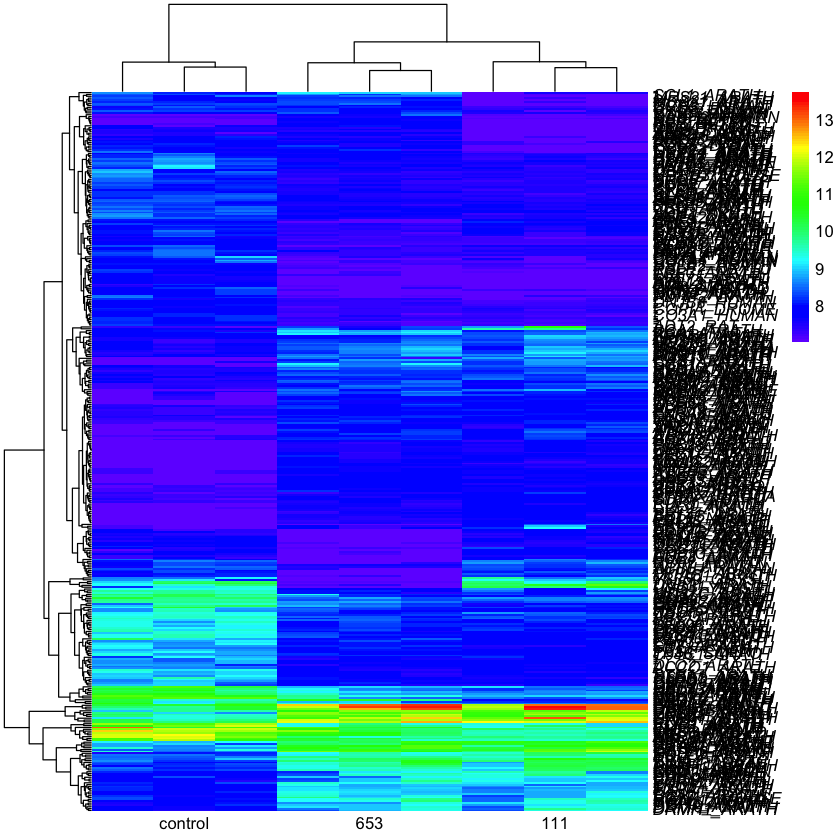

In [98]:
Mustard_DEGs=pheatmap(hmdf,
        color= rev(rainbow(96,start=0.0,end=0.74,alpha=1)),#,s=1,v=0.6,start=0.5,end=0.01),
        border_color = NA,
        show_colnames = TRUE,
        show_rownames = TRUE,
        labels_col=paste0(c(" ", "control"," ", " ","653"," ", "111"," "," ")),
        angle_col=0,
        labels_row = as.expression(newnames))

In [99]:
tiff("Mustard_HeatMap_2.tiff", width=5, height=45, units = 'in', res = 300)
Mustard_DEGs
dev.off()

pdf 
  2

**Venn Diagram**

Control vs 653

In [67]:
resSig_Cv653 = subset(Cv653, padj < 0.001)
resSig_Cv653_fragments = row.names(resSig_Cv653)

Control vs 111

In [68]:
resSig_Cv111 = subset(Cv111, padj < 0.001)
resSig_Cv111_fragments = row.names(resSig_Cv111)

653 vs 111

In [69]:
resSig_653v111 = subset(i653v111, padj < 0.001)
resSig_653v111_fragments = row.names(resSig_653v111)

Build common dataframe

In [70]:
vdDF = c(resSig_Cv653_fragments,
         resSig_Cv111_fragments,
        resSig_653v111_fragments)

Compare

In [71]:
resSig_Cv653_fragments.2 <- vdDF %in% resSig_Cv653_fragments
resSig_Cv111_fragments.2 <- vdDF %in% resSig_Cv111_fragments
resSig_653v111_fragments.2 <- vdDF %in% resSig_653v111_fragments

Compute venn diagram counts

In [72]:
counts = cbind(resSig_Cv653_fragments.2, resSig_Cv111_fragments.2, resSig_653v111_fragments.2)
vdcounts = vennCounts(counts)

Plot- this is incorrect!

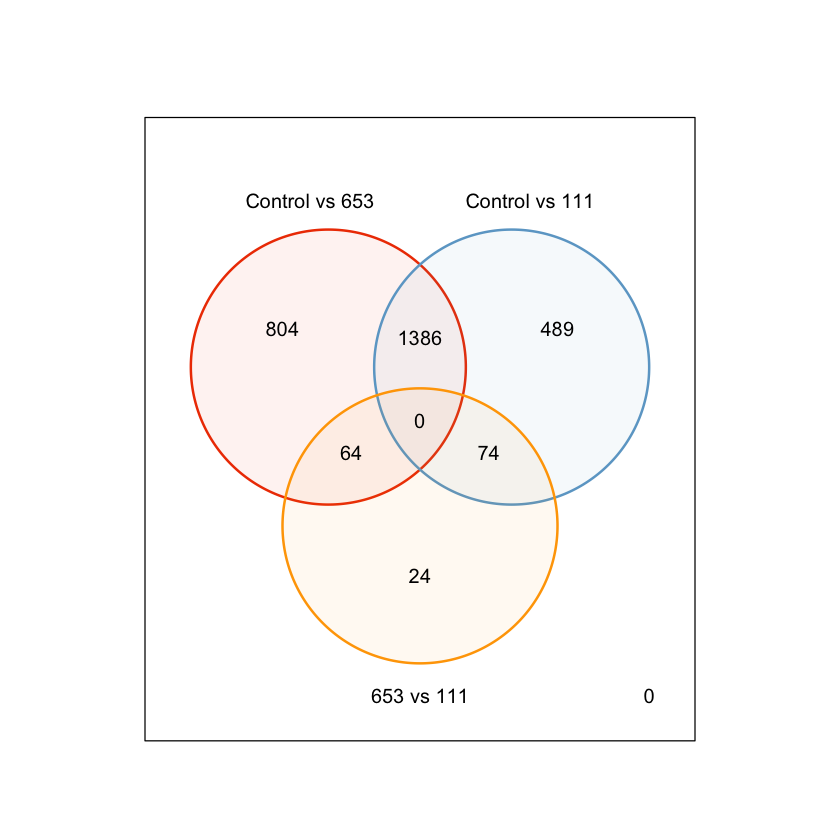

In [73]:
#tiff("Mustard_VD.tiff", width=5, height=5, units = 'in', res = 300)
vennDiagram(vdcounts,
            cex=1,
            lwd=2,
            names=c("Control vs 653","Control vs 111","653 vs 111"),
            circle.col = c("orangered2","skyblue3","orange1"))

#dev.off()

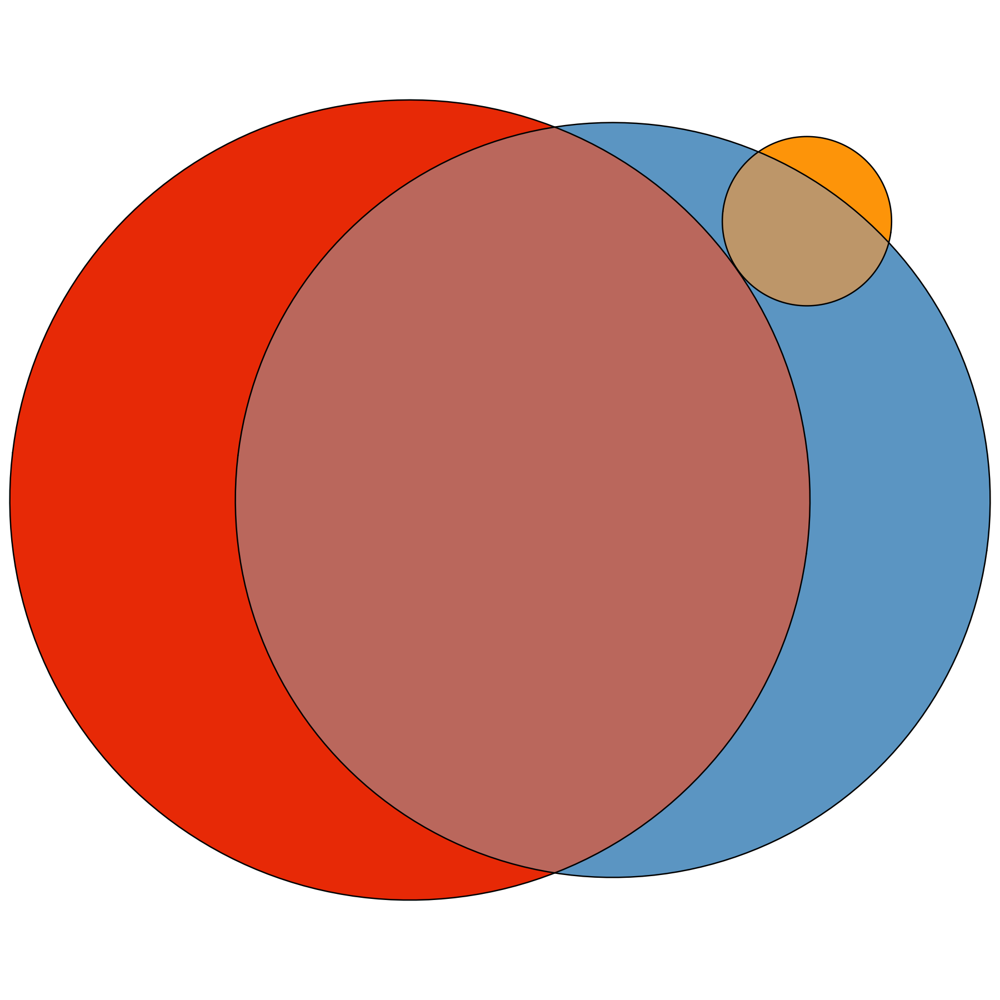

In [93]:
#tiff("Mustard_VD-2.tiff", width=5, height=5, units = 'in', res = 300)
VD = euler(c(A=804, B=489, C=24,
            "A&B"=1386, "A&C"=64, "B&C"=74,
            "A&B&C"=0))
plot(VD,
     fills = c("orangered2","skyblue3","orange1"),
     lwd=2,cex=1,
     labels = NULL
     )
options(repr.plot.width=15, repr.plot.height=15)
#dev.off()

Venn diagram for publication

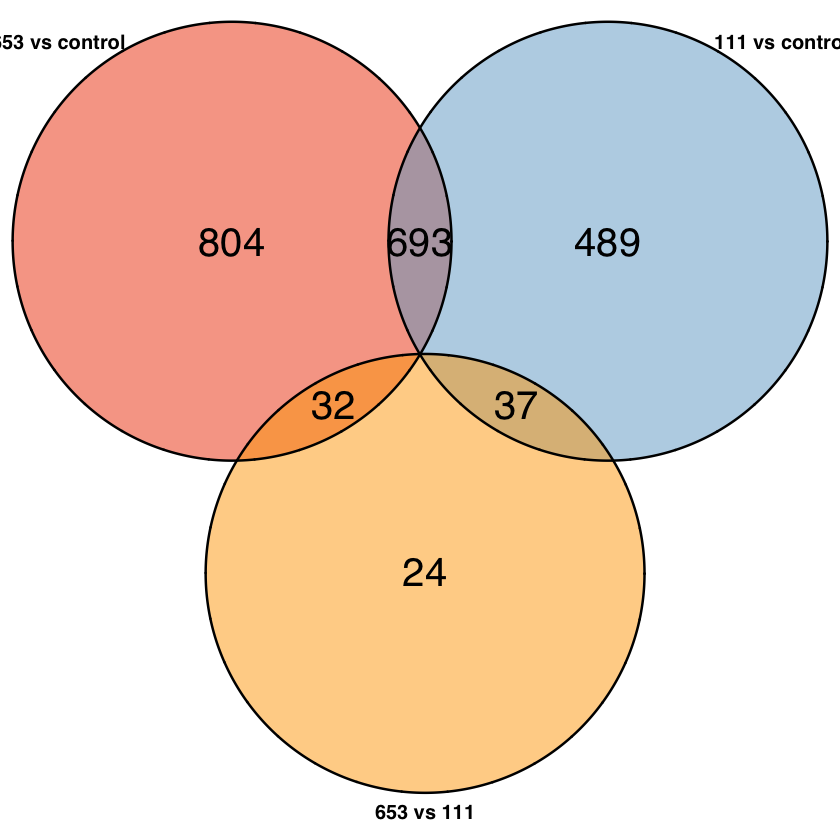

In [80]:
# tiff("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Mustard/Mustard_VD.tiff",
#     width=9, height=9, units = 'in', res = 300)
venn.plot = venn.diagram(list(resSig_Cv653$id, resSig_Cv111$id, resSig_653v111$id),
            filename=NULL, 
            category.names=c("653 vs control", "111 vs control", "653 vs 111"),
            fill=c("orangered2","skyblue3","orange1"),
            alpha=c(0.5,0.5,0.5),
            cex=2,fontfamily = "sans",
            cat.cex=1, cat.fontface="bold", cat.fontfamily = "sans", 
            euler.d = TRUE, scaled = FALSE,
            height = 3000, width = 3000, 
            resolution = 500, imagetype = "tiff")

grid.draw(venn.plot)
# dev.off()

Sanity checks

In [74]:
804+693+32 == length(resSig_Cv653$id)

[1] TRUE

In [75]:
693+37+489 == length(resSig_Cv111$id)

[1] TRUE

In [76]:
32+37+24 == length(resSig_653v111$id)

[1] TRUE

Total DEGs

In [95]:
804+489+24+32+693+37

[1] 2079

In [100]:
24/2079

[1] 0.01154401

### Export data<a class="anchor" id="twelveth-q"></a>  
[Back to Table of Contents](#toc-q)

* Control vs. 653

In [128]:
?read.csv()

In [ ]:
write.csv(as.data.frame(resSig_Cv653), 
          file="Mentha_DEGs_Cv653.csv")

* Control vs. 111

In [ ]:
write.csv(as.data.frame(resSig_Cv111), 
          file="Mentha_DEGs_Cv111.csv")

* 653 vs 111

In [ ]:
write.csv(as.data.frame(resSig_653v111), 
          file="Mentha_DEGs_653v111.csv")

### Graveyard<a class="anchor" id="thirteenth-q"></a>  
[Back to Table of Contents](#toc-q)

In [ ]:
# For each sample/row in the sample column
for (row in DF$Sample){
    # Split the sample by the underscore
    sample = strsplit(row,"_")
    # If sample contains S2, 
    if (grepl("S2",sample)){
    }
}

### Resources<a class="anchor" id="fourteenth-q"></a>  
[Back to Table of Contents](#toc-q)

 * R kernel installation: https://irkernel.github.io/installation/
 * DESeq2 installation: https://anaconda.org/bioconda/bioconductor-deseq2
 * DESeq2 data curation: https://www.bioconductor.org/packages/devel/bioc/vignettes/DEFormats/inst/doc/DEFormats.html
 * DESeq2 vignette: 
 http://bioconductor.org/packages/devel/bioc/vignettes/DESeq2/inst/doc/DESeq2.html
 http://master.bioconductor.org/packages/release/workflows/vignettes/rnaseqGene/inst/doc/rnaseqGene.html
 * Volcano plots: https://rdrr.io/github/kevinblighe/EnhancedVolcano/f/README.md
     * https://www.bioconductor.org/packages/release/bioc/vignettes/EnhancedVolcano/inst/doc/EnhancedVolcano.html
 